# $$ Wine Reviews Dataset $$

### ** This is the wineyard of Château Latour, which produces the most expensive wine in the dataset** 

<img src = 'http://winesinniagara.com/wp-content/uploads/2011/10/CIMG2010.jpg'>

** Data Dictionary** <br>

**Context - Wine Reviews Dataset from Kaggle, not the same as the wine dataset used in class which contains wine properties data **
<br><br>
'''After watching Somm (a documentary on master sommeliers) I wondered how I could create a predictive model to identify wines through blind tasting like a master sommelier would. The first step in this journey was gathering some data to train a model. I plan to use deep learning to predict the wine variety using words in the description/review. The model still won't be able to taste the wine, but theoretically it could identify the wine based on a description that a sommelier could give. If anyone has any ideas on how to accomplish this, please post them!'''
<br><br>
**Content**
<br><br>
The data consists of 10 fields:
<br><br>1. Points: the number of points WineEnthusiast rated the wine on a scale of 1-100 (though they say they only post reviews for wines that score >=80)
<br><br>2. Variety: the type of grapes used to make the wine (ie Pinot Noir)
<br><br>3. Description: a few sentences from a sommelier describing the wine's taste, smell, look, feel, etc.
<br><br>4. Country: the country that the wine is from
<br><br>5. Province: the province or state that the wine is from
<br><br>6. Region 1: the wine growing area in a province or state (ie Napa)
<br><br>7. Region 2: sometimes there are more specific regions specified within a wine growing area (ie Rutherford inside the Napa Valley), but this value can sometimes be blank
<br><br>8. Winery: the winery that made the wine
<br><br>9. Designation: the vineyard within the winery where the grapes that made the wine are from
<br><br>10. Price: the cost for a bottle of the wine 

<br><br>
** The AIM**
<br><br>
1. Are the countries of origin, province, regions or wineries good predictors of high point ratings or price?
<br><br>
2. Is the wine description correlated tightly with its points or price? Can we use the description to predict wine variety as intended by the data provider?
<br><br>
3. What would be the typical text descriptors of a highly rated wine? Can we cluster the adjectives on the corpus of 
text descriptions provided here?


In [1]:
#import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from unidecode import unidecode as unidec
#import plotly.plotly as py
#import plotly
#from plotly.offline import init_notebook_mode, iplot
#from plotly.graph_objs import *
#init_notebook_mode(connected=False)
import warnings
warnings.filterwarnings("ignore")
pd.options.display.max_colwidth = 300

import sys
stdout = sys.stdout
reload(sys)
sys.setdefaultencoding("utf-8")
sys.stdout =stdout


In [83]:
wine = pd.read_csv('winemag-data_first150k.csv',encoding='utf-8')

-----

## <div class = "alert alert-block alert-success"> Executive summary: <br><br><font size ='2'>1. Data cleaning and munging <br><br>2. Exploratory Data Analysis <br><br> 3. Simple NLP analysis on the text description column <br><br>4. Regression: Predicting price <br><br>5. Classification: High Prices and High Points <br><br>6. Word2Vec analysis on the semantic and syntactic relationships of the text<br><br>7. Build a text generative model using Recurrent Neural Net<br><br>8. Results from <br><br>9. Suggested further work </font></div>

## <div class="alert alert-block alert-info"> ** 1. Data cleaning and munging** </div>
---

In [3]:
wine.info()   # Only 11 columns to start with, many of them are location related info in text format. And only 2 columns with numeric data!!
              # Also there are >13000 rows without price. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150930 entries, 0 to 150929
Data columns (total 11 columns):
Unnamed: 0     150930 non-null int64
country        150925 non-null object
description    150930 non-null object
designation    105195 non-null object
points         150930 non-null int64
price          137235 non-null float64
province       150925 non-null object
region_1       125870 non-null object
region_2       60953 non-null object
variety        150930 non-null object
winery         150930 non-null object
dtypes: float64(1), int64(2), object(8)
memory usage: 12.7+ MB


In [5]:
wine.head(10)

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,0,US,"This tremendous 100% varietal wine hails from Oakville and was aged over three years in oak. Juicy red-cherry fruit and a compelling hint of caramel greet the palate, framed by elegant, fine tannins and a subtle minty tone in the background. Balanced and rewarding from start to finish, it has ye...",Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,1,Spain,"Ripe aromas of fig, blackberry and cassis are softened and sweetened by a slathering of oaky chocolate and vanilla. This is full, layered, intense and cushioned on the palate, with rich flavors of chocolaty black fruits and baking spices. A toasty, everlasting finish is heady but ideally balance...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,2,US,"Mac Watson honors the memory of a wine once made by his mother in this tremendously delicious, balanced and complex botrytised white. Dark gold in color, it layers toasted hazelnut, pear compote and orange peel flavors, reveling in the succulence of its 122 g/L of residual sugar.",Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,3,US,"This spent 20 months in 30% new French oak, and incorporates fruit from Ponzi's Aurora, Abetina and Madrona vineyards, among others. Aromatic, dense and toasty, it deftly blends aromas and flavors of toast, cigar box, blackberry, black cherry, coffee and graphite. Tannins are polished to a fine ...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,4,France,"This is the top wine from La Bégude, named after the highest point in the vineyard at 1200 feet. It has structure, density and considerable acidity that is still calming down. With 18 months in wood, the wine has developing an extra richness and concentration. Produced by the Tari family, former...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude
5,5,Spain,"Deep, dense and pure from the opening bell, this Toro is a winner. Aromas of dark ripe black fruits are cool and moderately oaked. This feels massive on the palate but sensationally balanced. Flavors of blackberry, coffee, mocha and toasty oak finish spicy, smooth and heady. Drink this exemplary...",Numanthia,95,73.0,Northern Spain,Toro,NaN,Tinta de Toro,Numanthia
6,6,Spain,"Slightly gritty black-fruit aromas include a sweet note of pastry along with a hint of prune. Wall-to-wall saturation ensures that all corners of one's mouth are covered. Flavors of blackberry, mocha and chocolate are highly impressive and expressive, while this settles nicely on a long finish. ...",San Román,95,65.0,Northern Spain,Toro,NaN,Tinta de Toro,Maurodos
7,7,Spain,"Lush cedary black-fruit aromas are luxe and offer notes of marzipan and vanilla. This bruiser is massive and tannic on the palate, but still lush and friendly. Chocolate is a key flavor, while baked berry and cassis flavors are hardly wallflowers. On the finish, this is tannic and deep as a sea ...",Carodorum Único Crianza,95,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
8,8,US,"This re-named vineyard was formerly bottled as deLancellotti. You'll find striking minerality underscoring chunky black fruits. Accents of citrus and graphite comingle, with exceptional midpalate concentration. This is a wine to cellar, though it is already quite enjoyable. Drink now through 2030.",Silice,95,65.0,Oregon,Chehalem Mountains,Willamette Valley,Pinot Noir,Bergström
9,9,US,"The producer sources from two blocks of the vineyard for this wine—one at a high elevation, which contributes bright acidity. Crunchy cranberry, pomegranate and orange peel flavors surround silky, succulent layers of texture that present as fleshy fruit. That delicately lush flavor has considera...",Gap's Crown Vineyard,95,60.0,California,Sonoma Coast,Sonoma,Pinot Noir

In [3]:
wine.isnull().sum()

Unnamed: 0         0
country            5
description        0
designation    45735
points             0
price          13695
province           5
region_1       25060
region_2       89977
variety            0
winery             0
dtype: int64

In [159]:
wine.description.value_counts()

86-88 This could work as a rich wine, because there is good structure and piles of botrytis. It could be delicious, with its lovely dry finish, but that's for the future.                                                                                                                                                                                                                                       6
92-94 Barrel sample. A rounded wine, its tannins submerged into the ripe fruits. It feels soft, and there is just a bite of alcohol. The structure is soft, generous, opulent.                                                                                                                                                                                                                                   6
Powerful in Zinny character, this blend of Dry Creek and Russian River grapes bursts with brawny flavors of wild berries, chocolate-covered mint, tobacco and pepper, wrapped into sturdy tannins.

### <div class = " alert alert-block alert-warning"> Drop null columns and nans and fillna: <br><br></div>
**Since there are so many null values in the region_2 and designation columns, and they don't seem to be providing much meaningful info except detailed location, we will drop them both. Also the Unnamed: 0 column is irrelevant, we shall drop them too.<br><br> There are also 5 entries without country, province and region data. Let's drop them too.**

In [84]:
wine_drop = wine.copy()
wine_drop = wine.drop(['Unnamed: 0','region_2','designation'],axis=1).drop(wine[wine.country.isnull()].index,axis=0)
wine_drop.region_1.fillna("None", inplace=True)

In [85]:
wine_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150925 entries, 0 to 150929
Data columns (total 8 columns):
country        150925 non-null object
description    150925 non-null object
points         150925 non-null int64
price          137230 non-null float64
province       150925 non-null object
region_1       150925 non-null object
variety        150925 non-null object
winery         150925 non-null object
dtypes: float64(1), int64(1), object(6)
memory usage: 10.4+ MB


In [86]:
# How many duplicates of wine description?

wine_drop.description.shape [0] - wine_drop.description.nunique()

53107

###  As there is a huge number of duplicate descriptions, let's keep them for now and see what our text analysis shows later 

In [88]:
wine[wine.description.str.contains('ritif')]['description']

198                                                                                                      Zesty and mineral, this unoaked, citrusy Chardonnay would make a particularly refreshing apéritif. Flavors of Asian pear and quince are crisp and cutting on the palate. Enjoy now for it's vivacious style.
995                                                                                                                                     This is a dry sparkling wine with tannins, spice and berry fruit, giving it a deep color. Not an apéritif wine, it's perfect for cutting through rich, oily foods. Drink now.
1548                                                                                                                         This soft, yeasty and sweet blend of Fernão Pires and Bical is fruity with apple and pear flavors. It has just enough acidity to keep it crisp on the finish and makes an easy apéritif.
1616                                                                  

In [19]:
### As we can see above, there are some special characters in the text as French uses a lot of accented words like 
### entrée, apéritif, carménere, Rhône etc... Use Unidecode to clean up all the special characters in the columns to 
### make our life easier later on

spec_char = ['winery','region_1','variety','description']           
for j in spec_char:
    
    wine_drop[j] = wine_drop[j].map(lambda x : unidec(x))

#wine_drop.to_pickle('wine_drop.pickle')

## <div class = " alert alert-block alert-info"> 2. Exploratory Data Analysis <br><br> <font size = '3'>As Singaporeans, we are always "cost-sensitive". So let's take a look at the priciest wines first </font></div> 
---

In [118]:
wine_drop.sort_values('price',ascending = False)[['country','description','points','price','winery']].head()

,country,description,points,price,winery
34920,France,"A big, powerful wine that sums up the richness of the vintage. It is densely fruity, spicy with an enormous black plum and berry fruit character to go with the acidity. It's concentrated while still showing such wonderfully pure fruit. The aging potential is immense.",99,2300.0,Château Latour
13318,US,"The nose on this single-vineyard wine from a strong, often overlooked appellation is tight and minerally before showing a slightly tropical kiwi element. Brightly acidic on the lively palate, flavors range from Key lime and Meyer lemon to pear skins and apple flesh.",91,2013.0,Blair
34922,France,"A massive wine for Margaux, packed with tannins and ripe fruit. It has more Cabernet Sauvignon than usual, giving intense black currant flavors with enticing acidity balanced by the sweetness of the fruit. Ripe swathes of this opulent fruit are also elegant and structured.",98,1900.0,Château Margaux
51886,France,"A wine that has created its own universe. It has a unique, special softness that allies with the total purity that comes from a small, enclosed single vineyard. The fruit is almost irrelevant here, because it comes as part of a much deeper complexity. This is a great wine, at the summit of Champ...",100,1400.0,Krug
26296,France,"A wine that has created its own universe. It has a unique, special softness that allies with the total purity that comes from a small, enclosed single vineyard. The fruit is almost irrelevant here, because it comes as part of a much deeper complexity. This is a great wine, at the summit of Champ...",100,1400.0,Krug


### As expected, the most expensive wine is produced in France, in a winery called Château Latour, and the points awarded to it is also top. Hence we can tell that there should be some correlation between price and points. 

In [119]:
print wine_drop.points.describe()
print wine_drop.points.unique()
print wine_drop.price.describe()

count    150925.000000
mean         87.888527
std           3.222290
min          80.000000
25%          86.000000
50%          88.000000
75%          90.000000
max         100.000000
Name: points, dtype: float64
[ 96  95  94  90  91  86  89  88  87  93  92  85  84  83  82  81 100  99
  98  97  80]
count    137230.000000
mean         33.132019
std          36.323072
min           4.000000
25%          16.000000
50%          24.000000
75%          40.000000
max        2300.000000
Name: price, dtype: float64


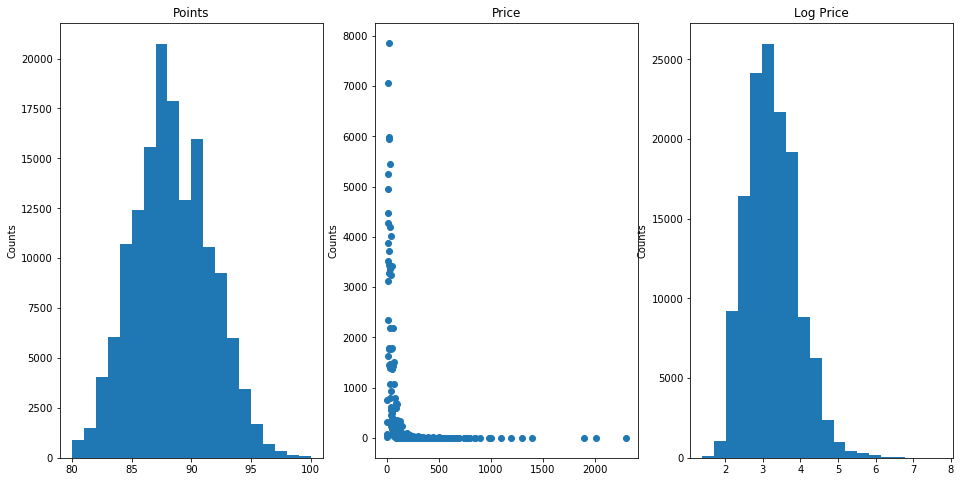

In [120]:
f,ax = plt. subplots(1,3, figsize = (16,8))
plt.subplot(1,3,1)
plt.hist(wine_drop.points.values,bins =20)
plt.title('Points')
plt.ylabel('Counts')
plt.subplot(1,3,2)
plt.scatter(wine_drop.price.dropna().value_counts().index,wine_drop.price.dropna().value_counts().values,)
plt.title('Price')
plt.ylabel('Counts')

plt.subplot(1,3,3)
plt.hist(np.log(wine_drop.price.dropna()).values,bins =20)
plt.title('Log Price')
plt.ylabel('Counts')
plt.show()

In [22]:
from scipy.stats import spearmanr

#The price spans 3 orders of magnitude, hence we should take the log of price
wine_drop.price = np.log(wine_drop.price)
sns.jointplot (x = 'points', y = 'price', data= wine_drop, kind = 'scatter',color = 'm', stat_func=spearmanr,size =8,s=12,alpha=0.6)
plt.title('Log(Price) vs Points',fontsize = 14)
plt.show()

### <div class = "alert alert-block alert-warning"> ** It can be seen that the points data is actually made up of 20 discrete values spanning 80 - 100. This is also mentioned in the data dictionary which says that WineEnthusiasts only post reviews for wines that <font color='red'>score >=80</font>. Hence this dataset only consists of wine reviews on wines which have been awarded high points. <br> <br>Yet the distribution of wine price is skewed towards the lower ranges (closer to zero), instead of higher prices. This seems to suggest that WineEnthusiasts can award high points to all price tiers of wines <br><br> ** </div>

## Let's take a look at the distribution of the wines by Country

In [122]:
country_dist = pd.DataFrame(data = zip(wine_drop.country.value_counts().index, wine_drop.country.value_counts().values),
                            columns = ['country', 'counts'])
print 'Unique countries: ', wine_drop.country.nunique()
country_dist.head()

Unique countries:  48


,country,counts
0,US,62397
1,Italy,23478
2,France,21098
3,Spain,8268
4,Chile,5816


In [18]:
data= [dict(type = 'choropleth',
            locations = country_dist['country'],
            z = country_dist['counts'],
            locationmode = 'country names',
            colorscale = 'RdYlBu',
            text = country_dist['country'])]
layout = dict(title = 'Wine descriptions distributed by Country',    
            geo = dict(
            showframe = True,
            showcoastlines = True))
fig = dict(data = data, layout=layout)

plotly.offline.plot(fig)#, output_type = 'file',filename='country_dist')

'file:///Users/bernt73/anaconda/DSI course/Projects/project-capstone/Wine review/country_dist.html'

In [82]:
%%HTML
<iframe width = '90%' height='600' src='country_dist.html'></iframe>

## Provinces, Regions, Wineries

Province nuniques : 455
Region nuniques : 1236
winery nuniques : 14809


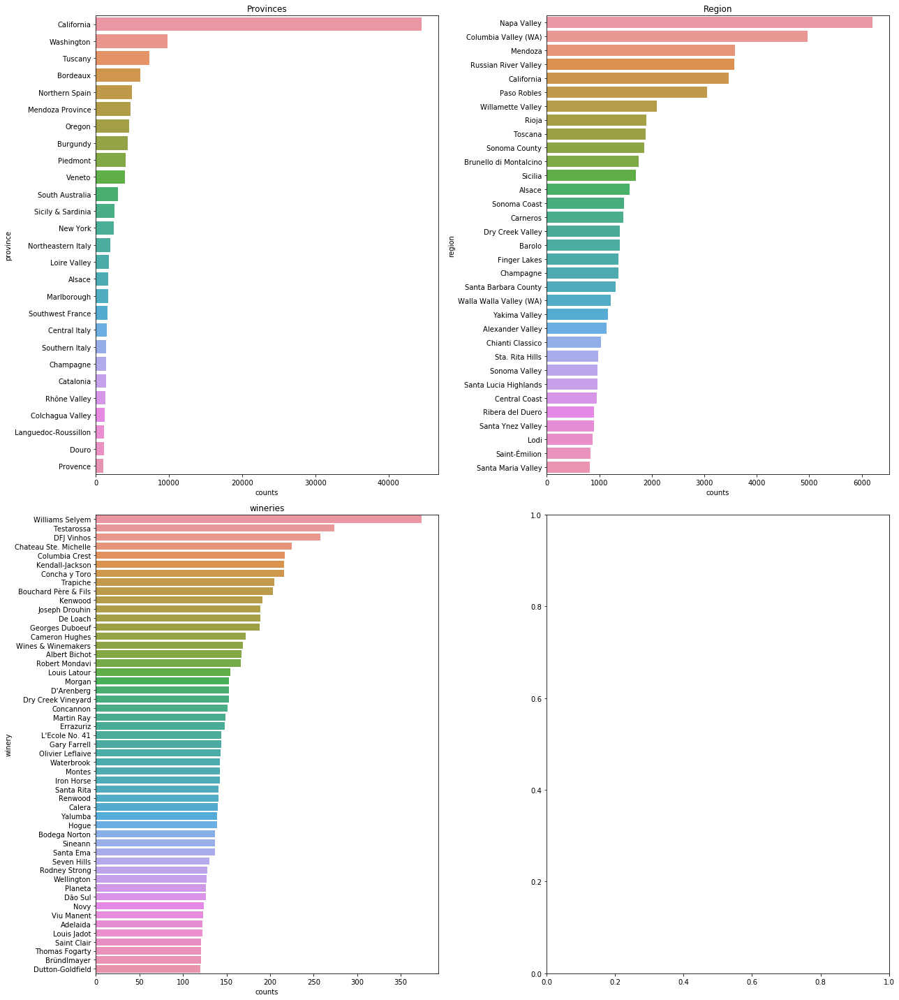

In [123]:
print 'Province nuniques :', wine_drop.province.nunique()
print 'Region nuniques :', wine_drop.region_1.nunique()
print 'winery nuniques :', wine_drop.winery.nunique()

f,ax =plt.subplots(2,2, figsize=(18,20))
p = pd.DataFrame(data = zip(wine_drop.province.value_counts().sort_values().index,wine_drop.province.value_counts().sort_values().values), 
                 columns = ['province','counts'])
p1 = p[p['counts']>=1000].sort_values('counts',ascending=False)

r = pd.DataFrame(data = zip(wine_drop.region_1.value_counts().sort_values().index,wine_drop.region_1.value_counts().sort_values().values), 
                 columns = ['region','counts'])
r1= r[r['counts']>=800].sort_values('counts',ascending=False)

w=pd.DataFrame(data = zip(wine_drop.winery.value_counts().sort_values().index,wine_drop.winery.value_counts().sort_values().values), 
                 columns = ['winery','counts'])
w1 =w[w['counts']>=120].sort_values('counts',ascending=False)

sns.barplot(x='counts',y='province',data = p1, label ='Provinces',ax = ax[0][0]).set_title('Provinces')
sns.barplot(x='counts',y='region',data = r1, label ='Region',ax = ax[0][1]).set_title('Region')
sns.barplot(x='counts',y='winery',data = w1, label ='wineries',ax = ax[1][0]).set_title('wineries')

plt.tight_layout()
plt.show()

In [124]:
countries_points = wine_drop.groupby('country',).points.describe()
countries_points.sort_values('mean',ascending=False)

,count,mean,std,min,25%,50%,75%,max
country,,,,,,,,
England,9.0,92.888889,1.364225,91.0,92.00,94.0,94.00,94.0
Austria,3057.0,89.276742,2.557063,81.0,88.00,89.0,91.00,98.0
France,21098.0,88.925870,3.199695,80.0,87.00,89.0,91.00,100.0
Germany,2452.0,88.626427,2.928762,80.0,87.00,89.0,91.00,97.0
Italy,23478.0,88.413664,2.728914,80.0,87.00,88.0,90.00,100.0
Canada,196.0,88.239796,2.467979,82.0,87.00,88.5,90.00,93.0
Slovenia,94.0,88.234043,2.007650,82.0,87.25,89.0,90.00,92.0
Morocco,12.0,88.166667,2.657180,82.0,87.00,88.5,89.25,93.0
Turkey,52.0,88.096154,1.575046,84.0,87.00,88.0,89.00,92.0


In [125]:
countries_price = wine_drop.groupby('country',).price.describe()
countries_price.sort_values('mean',ascending=False)

,count,mean,std,min,25%,50%,75%,max
country,,,,,,,,
US-France,1.0,3.912023,NaN,3.912023,3.912023,3.912023,3.912023,3.912023
England,8.0,3.837776,0.218761,3.637586,3.682550,3.795426,3.896871,4.317488
Luxembourg,9.0,3.693020,0.164252,3.583519,3.583519,3.583519,3.912023,3.912023
France,14785.0,3.406882,0.803275,1.609438,2.833213,3.218876,3.912023,7.740664
Hungary,230.0,3.383433,0.832804,1.945910,2.708050,3.332205,3.988984,6.638568
Canada,194.0,3.362048,0.578121,2.484907,2.944439,3.218876,3.688879,4.976734
Italy,18784.0,3.359660,0.685000,1.609438,2.833213,3.218876,3.871201,6.802395
US,62139.0,3.339746,0.579289,1.386294,2.944439,3.332205,3.713572,7.607381
Germany,2347.0,3.321543,0.699113,1.609438,2.890372,3.178054,3.688879,6.652863


In [126]:
wine_drop.groupby('country',).winery.describe().sort_values('count',ascending = False)

,count,unique,top,freq
country,,,,
US,62397,4761,Williams Selyem,374
Italy,23478,2571,Planeta,126
France,21098,2940,Bouchard Père & Fils,203
Spain,8268,1436,Freixenet,88
Chile,5816,292,Concha y Toro,216
Argentina,5631,523,Trapiche,205
Portugal,5322,372,DFJ Vinhos,258
Australia,4957,554,D'Arenberg,153
New Zealand,3320,332,Saint Clair,121


##  Wine Variety Distribution

Variety nuniques:  632


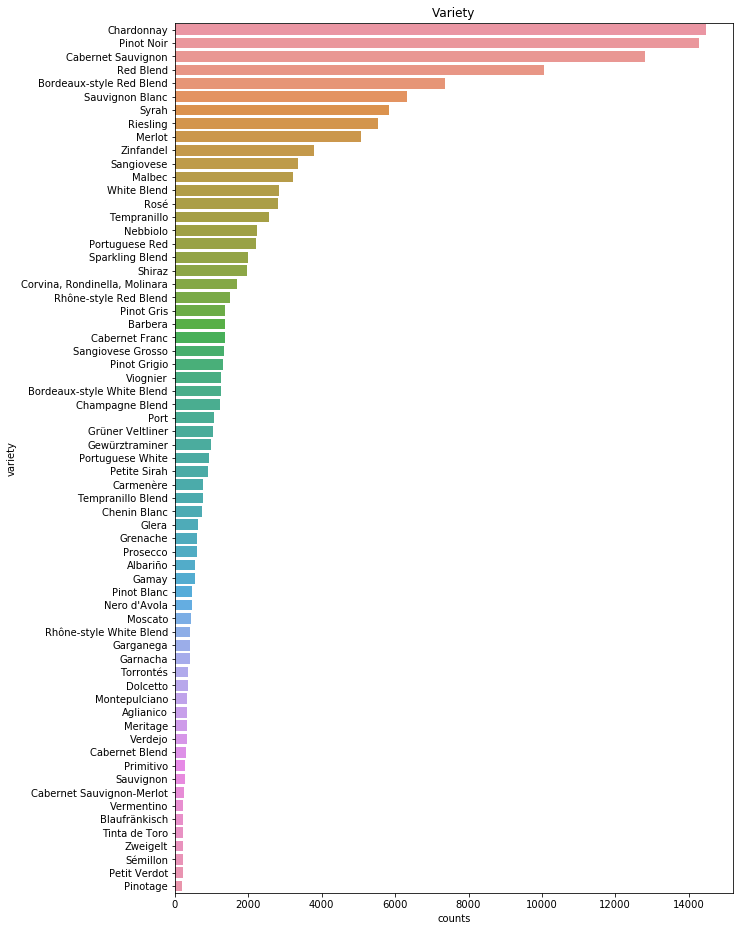

In [127]:
print 'Variety nuniques: ', wine_drop.variety.nunique()
plt.subplots(figsize=(10,16))
v=pd.DataFrame(data = zip(wine.variety.value_counts().sort_values().index,wine.variety.value_counts().sort_values().values), 
                 columns = ['variety','counts'])
v1 =v[v['counts']>=200].sort_values('counts',ascending=False)

sns.barplot(x='counts',y='variety',data = v1, label ='Variety').set_title('Variety')
plt.show()

#### 48 Countries 
#### 455 Provinces 
#### 1236 Regions 
#### 14809 Wineries
### All these are in text format, but can be treated as categorical features

## <div class = 'alert alert-block alert-info'> ** 3. NLP analysis - word distribution and sentiment analysis of the text corpus**</div>
---

In [15]:
import nltk
from nltk.corpus import stopwords
import gensim
from sklearn.feature_extraction import stop_words
from nltk.tokenize import PunktSentenceTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
import string
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [46]:
# Clean up text by removing stop words, lemmatize and remove punctuations. Create a clean corpus and save to pickle 
# for further analysis
stop_words_1 = stopwords.words('english')
stop_words_2 = stop_words.ENGLISH_STOP_WORDS
lemmatizer = WordNetLemmatizer()
punctuation = set(string.punctuation) 

def cleaning(article):
    one = " ".join([i for i in article.lower().split() if i not in stop_words_2])
    two = "".join(i for i in one if i not in punctuation)
    three = " ".join(lemmatizer.lemmatize(i) for i in two.split())
    return three

clean_corpus = []
for desc in wine_drop.description:
    clean_corpus.append(cleaning(desc))

len(clean_corpus)

In [22]:
## Convert to pickle for easy retrieval

#gensim.utils.pickle(clean_corpus, 'clean_corpus')                           # Uncomment if pickling to a new pickle file
clean_corpus = gensim.utils.unpickle('clean_corpus')
wine_drop.description = clean_corpus

#token_corpus = [nltk.word_tokenize(sent.decode('utf-8')) for sent in clean_corpus]  # Uncomment if pickling to a new pickle file
token_corpus = gensim.utils.unpickle('token_corpus')
#gensim.utils.pickle(token_corpus,'token_corpus')

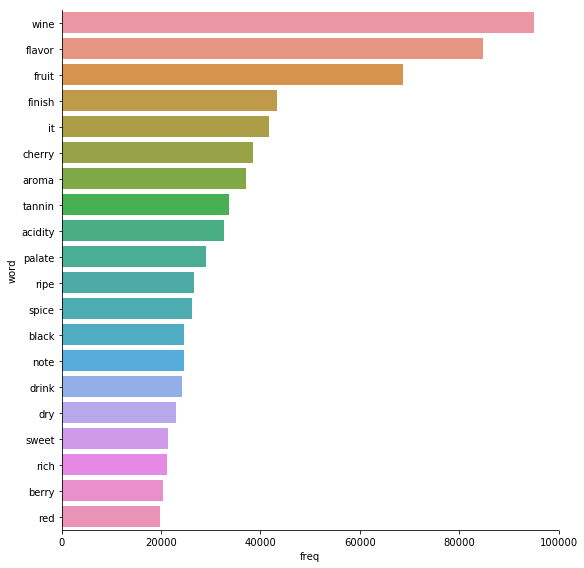

In [132]:
# What are the most frequently occurring words in our text corpus??
import itertools

tokens = list(itertools.chain.from_iterable(token_corpus))
wordfreq = nltk.FreqDist(tokens)
word = []
freq = []
dfword= pd.DataFrame(columns = ['word', 'freq'])
for i in wordfreq.most_common(20):
    word.append(i[0])
    freq.append(i[1])
    
dfword.word = word
dfword.freq = freq
sns.factorplot(y='word', x='freq', data=dfword, kind = 'bar',size = 8)
plt.show()

<div class= 'alert alert-block alert-info'> ** Sentiment analysis using Vader - Valence  Aware  Dictionary  for 
sEntiment Reasoning** <br>
<br>This package tries to compute polarity_scores by collecting a list of "sentiments":<br>
<br>
 - Checks whether just some words in the input are ALL CAPS <br>
 - Determine if input contains negation words <br>
 - Checks for "but" too! <br>
 - Checks if the preceding words increase, decrease, or negate/nullify the valence (BOOSTER_DICT: B_INCR, B_DECR) <br>
 - Checks if booster/dampener word is in ALLCAPS <br>
 - Handles emoticons too!! <br>

</div>

In [23]:
senanalyze = SentimentIntensityAnalyzer()
cpd,neu,neg,pos = [],[],[],[]
for sent in clean_corpus:
    vs = []
    vs = senanalyze.polarity_scores(sent)
    cpd.append(vs['compound'])
    neu.append(vs['neu'])
    neg.append(vs['neg'])
    pos.append(vs['pos'])

wine_drop['pos'] = pos
wine_drop['neg'] = neg
wine_drop['neu'] = neu
wine_drop['cpd'] = cpd

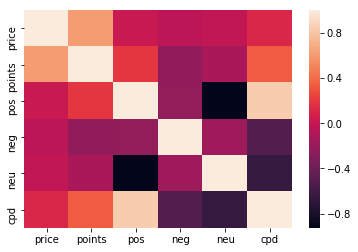

In [134]:
sns.heatmap(wine_drop[['price','points','pos','neg','neu','cpd']].corr())    
plt.show()

In [135]:
wine_drop[['price','points','pos','neg','neu','cpd']].describe()

,price,points,pos,neg,neu,cpd
count,137230.000000,150925.000000,150925.000000,150925.000000,150925.000000,150925.000000
mean,3.243772,87.888527,0.218189,0.023884,0.757930,0.552302
std,0.662619,3.222290,0.133115,0.050770,0.131893,0.359909
min,1.386294,80.000000,0.000000,0.000000,0.211000,-0.932100
25%,2.772589,86.000000,0.121000,0.000000,0.665000,0.381800
50%,3.178054,88.000000,0.216000,0.000000,0.758000,0.670500
75%,3.688879,90.000000,0.311000,0.000000,0.852000,0.836000
max,7.740664,100.000000,0.789000,0.692000,1.000000,0.992400


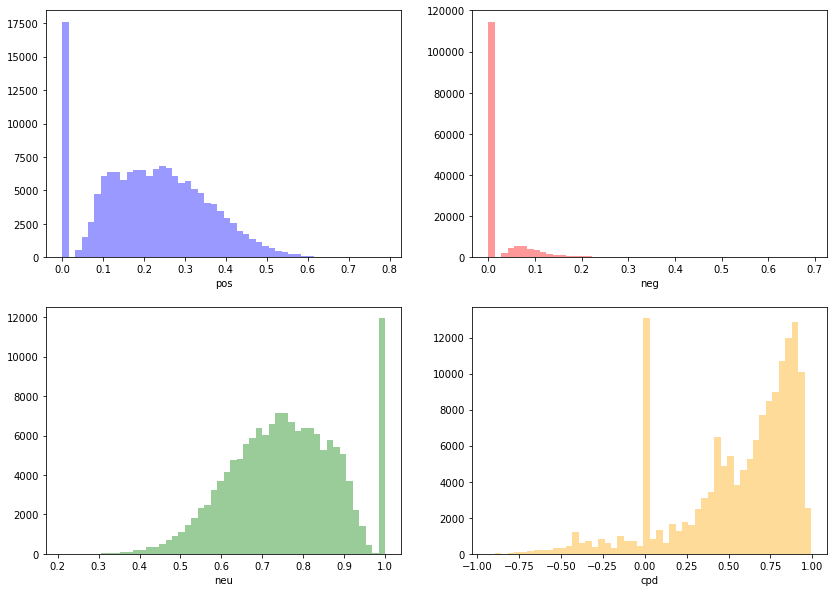

In [136]:
f,ax =plt.subplots(2,2, figsize= (14,10))
sns.distplot(wine_drop['pos'], kde=False, ax=ax[0][0], color = 'blue')
sns.distplot(wine_drop['neg'], kde=False, ax=ax[0][1], color = 'red')
sns.distplot(wine_drop['neu'], kde=False, ax=ax[1][0], color = 'green')
sns.distplot(wine_drop['cpd'], kde=False, ax=ax[1][1], color = 'orange')
plt.show()

#### <div class = "alert alert-block alert-warning"> There are very few text documents with negative sentiments. Most of them are either neutral or positive. This is also to be expected as the WineEnthusiasts have confirmed that only reviews for wines with >80 points are posted. VADER has helped to confirm that the <font color='red'> sentiment range of our text corpus is actually quite narrow. </font> <br><br> So let's drop the neg sentiment column since it doesn't provide much info anyway.</div>

In [24]:
wine_drop.drop('neg',axis = 1, inplace = True)

In [145]:
## What are some of the words that give neutral scores of 1.0 ??
wine_drop[(wine_drop.cpd==0) & (wine_drop.pos==0)][['description','cpd','pos','neu','points','price']].head(20)    

,description,cpd,pos,neu,points,price
24,san josebased producer adam comartin head 1100 foot mountain source fruit tremendous wine offer wild cherry sage eucalyptus scent nose ripe black plum strawberry fruit lead palate followed aciddriven wave juniper pine bay leaf finishing menthollike sensation,0.0,0.0,1.0,95,3.806662
30,bulgarian mavrud present nose suggestion dried cherry black plum freshly ground black pepper whiff eucalyptus mouth balanced soft tannin mingling dried cherry cassis black plum,0.0,0.0,1.0,90,2.708050
37,aroma forest floor violet red berry whiff dark baking spice unfold glass wild cherry black raspberry ground pepper star anise drive palate framed firm finegrained tannin classic tuscan red drink 2020,0.0,0.0,1.0,90,3.367296
44,dark color flavor profile mediumbodied cornas boast aroma flavor reminiscent chocolate fudge espresso plummy fruit framed soft dusty tannin drink now–2025,0.0,0.0,1.0,90,4.234107
46,sunbaked earth ripe berry baking spice whiff menthol meld glass juicy palate offer red cherry pomegranate star anise mocha hint tobacco alongside finegrained tannin,0.0,0.0,1.0,90,4.499810
47,blended 9 malbec 9 cabernet franc 5 petit verdot perennial classic winery sister brand cuvaison juicy cherry cassis sustains big pillowy tannin tar suggesting time fruit match structure drink 2020,0.0,0.0,1.0,90,4.094345
59,savory blend 40 merlot 30 cabernet sauvignon 25 cabernet franc 5 syrah open aroma roasted coffee bean leather tobacco dark woodland berry chewy palate offer juicy plum cassis clove alongside polished tannin drink 2019,0.0,0.0,1.0,90,4.094345
66,steely character young chablis apparent wine crisp lemon flavored mineral edge wine juicy freshness young heart needing age drink 2018,0.0,0.0,1.0,91,3.637586
79,underbrush smoke mocha dark fruit aroma lead nose carry ripe palate dried black cherry licorice clove firm velvety tannin provide framework drink 2018–2028,0.0,0.0,1.0,91,4.317488
82,berry baking spice dried iris mint hint vanilla come structured wine palate note white pepper sage anise orange zest yellow peach accent red cherry core balsamic note close finish firm refined tannin provide backbone,0.0,0.0,1.0,91,NaN


In [144]:
## There isn't any review with positive score of 1.0. What about those that have been given positive scores of 0.5 ??
wine_drop[wine_drop.pos==0.5][['description','cpd','pos','neu','points','price']].head(20) 

,description,cpd,pos,neu,points,price
2271,herbaceous wine fresh steely crisp bright acidity cut strongly lively texture giving apple lemon pink grapefruit developing fast ready drink,0.9001,0.5,0.43,87,NaN
4654,great category gentle floral note honey apple mark nose palate light body give charming delicate character wellbalanced refreshing sweet wine,0.9325,0.5,0.50,88,2.484907
11626,great fruit produce delicious wine structured strong steely element yellow fruit layer wood juicy acidity aftertaste bright button,0.9325,0.5,0.50,91,3.555348
12112,whiff assam tea honey permeate bright bristling spätlese accenting succulent yellow peach tangerine flavor it vibrant brisk finish sweet meandering marmalade kiss stunning structured evolve beautifully 2025,0.9584,0.5,0.50,93,3.526361
16355,smooth crisp attractive acidity strawberry fruit poised elegant just right acidity,0.7906,0.5,0.50,88,2.397895
19040,delicious pleasurable flavor milk chocolate cherry dried red currant sweet toast oak tannin wonderfully pure complex napa style,0.9325,0.5,0.50,91,3.951244
19519,bosan beautiful amarone gorgeous intensity personality it rich ripe wine perfectly integrated aroma jammy fruit exotic spice followed pretty mineral tobacco shading it particularly successful mouth show depth persistency,0.9750,0.5,0.50,93,4.700480
19743,elegant powerful beautiful wine show best quality amarone tradition boast luscious mouthfeel flavorful accent red cherry sweet spice tobacco polished black stone,0.9517,0.5,0.50,92,4.499810
23285,fresh wine red cherry fruit giving bright character tannin soft attractive acidity lightly textured ready drink 1–2 year,0.9001,0.5,0.50,86,3.555348
24224,cecchis coevo wonderful super tuscan blend cost half cult wine elite category wine rich opulent intense extremely focused term aromatic delivery mouthfeel long textured rich,0.9583,0.5,0.50,94,4.060443


#### <div class = "alert alert-block alert-warning"> From the text we can see that reviews with high neutral sentiment scores can also be given to wines with high points (95). I'm starting to have doubts on the "quality" of reviews given by the WineEnthusiasts. <br><br> On the other hand, some of the distinctive words that appear in reviews with positive scores are <font color='red'>"sweet", "excellent","delicious","powerful", "attractive", "gorgeous", "wonderfully","beautifully" </font>, etc. etc. <br><br> </div>

## <div class = "alert alert-block alert-info"> 4. Regression: Predicting wine prices </div>
---
### Now let's try to put together all the features and try to predict the price of the wine for the missing values: <br><br> <font size = '2'> 1. Country <br> 2. Variety <br> 3. Winery <br> 4. Region <br> 5. Reviews <br><br> For the features of Country, Variety, Winery, and Region, we can use Label Encoder and OneHotEncoder to convert them to dummy columns. As for the Reviews column, we will use TFIDF to help us filter the words and retain the most important words as features and convert to word vectors. </font> 

In [2]:
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor,RandomForestRegressor,RandomForestClassifier
from sklearn.cross_validation import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LinearRegression,LassoCV,RidgeCV
from sklearn.tree import DecisionTreeRegressor

In [3]:
#wine_drop.to_pickle('wine_sentiment.pickle')

wine_drop = pd.read_pickle('wine_sentiment.pickle')
wine_drop.reset_index(inplace = True)               # Index of the original wine_drop dataframe is no longer in sequence 
                                                    # after we dropped a few of the rows. If we do not reset the index,
                                                    # X_train dataframe will have a rows of NaNs generated from the
                                                    # .loc method later on

In [12]:
c = wine_drop.country.nunique()
p = wine_drop.province.nunique()
v = wine_drop.variety.nunique()
w =wine_drop.winery.nunique()
r = wine_drop.region_1.nunique()
print c+p+v+w+r                     # How many dummy columns would be generated if i take all these 4 categorical 
                                    # features at the same time?? We are dealing with >17000 classes!!
                                    

17170


In [17]:
%%time
# Create our feature columns

cat1 = ['country','province','variety']
#cat2 = ['winery','region_1']               ## There are 14809 wineries, if we get 14809 dummy columns, it may take a  
                                            ## long time, and kernel may break. Let's work on the other features first.
le1 = LabelEncoder()
le2 = LabelEncoder()
le3 = LabelEncoder()
ohe = OneHotEncoder()
tfidf_vec1 = TfidfVectorizer(sublinear_tf=True,max_df=0.7,max_features=4000, ngram_range = (1,3), stop_words='english')

Xprov = ohe.fit_transform(le1.fit_transform(wine_drop.province).reshape(-1,1))
Xvar = ohe.fit_transform(le2.fit_transform(wine_drop.variety).reshape(-1,1))
Xcoun = ohe.fit_transform(le3.fit_transform(wine_drop.country).reshape(-1,1))
Xtext = tfidf_vec1.fit_transform(wine_drop.description)

Xprovdf = pd.DataFrame(data = Xprov.toarray(), columns = le1.classes_.tolist())
Xvardf = pd.DataFrame(data = Xvar.toarray(), columns = le2.classes_.tolist())
Xcoundf = pd.DataFrame(data = Xcoun.toarray(), columns = le3.classes_.tolist())
Xtextdf = pd.DataFrame(data = Xtext.toarray(), columns = tfidf_vec1.get_feature_names())

cat1_dummy = pd.concat([Xprovdf,Xvardf,Xcoundf,Xtextdf], axis = 1)

CPU times: user 55.6 s, sys: 11.1 s, total: 1min 6s
Wall time: 1min 9s


In [18]:
%%time

X_test = cat1_dummy.loc[wine_drop[wine_drop.price.isnull()].index,:]
X_test = pd.concat([X_test, wine_drop[wine_drop.price.isnull()][['points','pos','neu','cpd']]], axis = 1) # Join back the 'points','pos','neu','cpd' columns
X_train = cat1_dummy.loc[wine_drop[~wine_drop.price.isnull()].index,:]
X_train = pd.concat([X_train, wine_drop[~wine_drop.price.isnull()][['points','pos','neu','cpd']]],axis = 1) # Join back the 'points','pos','neu','cpd' columns
y_train = wine_drop[~wine_drop.price.isnull()]['price']


ss = StandardScaler()
X_train['points'] = ss.fit_transform(X_train['points'].reshape(-1, 1))  # The price column has been np.log, only the points column need to be scaled now
X_test['points'] = ss.transform(X_test['points'].reshape(-1, 1))

CPU times: user 20.5 s, sys: 43.2 s, total: 1min 3s
Wall time: 1min 21s


### For the winery and region_1 features, let's adopt a different approach due to the sheer size of the classes (>15000 in all). Let's use Anova to help us filter out most of the insignificant classes 

In [8]:
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.feature_selection import SelectPercentile
from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder

sel_perc = SelectPercentile(f_classif, percentile = 30)
skbcls = SelectKBest(f_classif, k=30)
le4 = LabelEncoder()
le5 = LabelEncoder()
ohe1 = OneHotEncoder()

Xregion = ohe1.fit_transform(le4.fit_transform(wine_drop.region_1).reshape(-1,1))
Xwinery = ohe1.fit_transform(le5.fit_transform(wine_drop.winery).reshape(-1,1))

Xregiondf = pd.DataFrame(data = Xregion.toarray(), columns = le4.classes_.tolist())
Xwinerydf = pd.DataFrame(data = Xwinery.toarray(), columns = le5.classes_.tolist())


#### <font color='red'>Be careful with the next 3 cells, memory intensive due to the sheer number of classes involved. The cells are split up more finely for a good reason. Each cell can only perform 1 or 2 lines of code due to the memory requirements. Try to read in the pickled file wherever possible </font>

In [4]:
Xwinery_train = Xwinerydf.loc[wine_drop[~wine_drop.price.isnull()].index,:]     ### Very memory intensive, have to create winery dataframe
                                                                                ### after restarting kernel and saving to pickle file right away
y_train = wine_drop[~wine_drop.price.isnull()]['price']

In [5]:
sel_perc.fit(Xwinery_train,ytrain)                ## Initially I had wanted to use SelectKbest for filtering both wineries and regions, but
                                                  ## due to the sheer number of classes for wineries, my kernel kept restarting when using 
                                                  ## SelectKBest. Hence I had no choice but to use SelectPercentile instead for it.
anova2 =pd.DataFrame (data =zip(Xwinery_train.columns, sel_perc.scores_,sel_perc.pvalues_,sel_perc.get_support(indices=False)),columns = 
                     ['Col','Scores','p-value','ClsSupport']).sort_values('Scores',ascending=False)
winery_sel_col = anova2[anova2['p-value'] < 0.001].Col.tolist()
len(winery_sel_col)

1667

In [4]:
#Xwinery_train.drop([h for h in Xwinery_train.columns.tolist() if h not in winery_sel_col], axis = 1,inplace = True)
#Xwinery_train.to_pickle('Xwinery_train.pickle')                                  ### The pickle file is 1.8 Gb in size!!!  ###
Xwinery_train = pd.read_pickle('Xwinery_train.pickle')
print Xwinery_train.shape

(137230, 1667)


In [11]:
Xregion_train = Xregiondf.loc[wine_drop[~wine_drop.price.isnull()].index,:]
ytrain = wine_drop[~wine_drop.price.isnull()]['price']
skbcls.fit(Xregion_train,ytrain)
anova1 =pd.DataFrame (data =zip(Xregion_train.columns, skbcls.scores_,skbcls.pvalues_,skbcls.get_support(indices=False)),columns = 
                     ['Col','Scores','p-value','ClsSupport']).sort_values('Scores',ascending=False)
region_sel_col = anova1[anova1['p-value'] < 0.001].Col.tolist()
len(region_sel_col)

235

In [12]:
Xregion_train.drop([h for h in Xregion_train.columns.tolist() if h not in region_sel_col], axis = 1,inplace = True)

print Xregion_train.shape

(137230, 235)


### We can now concatenate all the dummy columns together into one mammoth training dataframe!!! But first we have to take care of repeated column names as there may be some words in the TFIDF vectors that coincide with the country names, province names, winery names or variety names, if not the file pickling will not start. 

In [25]:
print X_train.shape
print Xregion_train.shape
print Xwinery_train.shape

(137230, 5139)
(137230, 235)
(137230, 1667)


In [26]:
X_train = pd.concat([X_train,Xregion_train,Xwinery_train],axis=1)         ### Caution!! Concatenating >7000 columns ###


In [27]:
allcol = X_train.columns.tolist()
uniqcol = X_train.columns.unique().tolist()
for i in uniqcol:
    allcol.remove(i)
dupcol = allcol
print len(dupcol)
dupcol              ### This is the list of duplicate column names in the X_train dataframe

41


['Port',
 'Tokaji',
 u'Austria',
 u'Brazil',
 u'Bulgaria',
 u'Chile',
 u'China',
 u'Croatia',
 u'Cyprus',
 u'Egypt',
 u'England',
 u'Georgia',
 u'Germany',
 u'Greece',
 u'Hungary',
 u'Israel',
 u'Lebanon',
 u'Lithuania',
 u'Macedonia',
 u'Moldova',
 u'Morocco',
 u'New Zealand',
 u'Portugal',
 u'Romania',
 u'Slovenia',
 u'South Africa',
 u'Tunisia',
 u'Turkey',
 u'Ukraine',
 u'Uruguay',
 'Alsace',
 'Bordeaux',
 'California',
 'Carinena',
 'Champagne',
 'South Australia',
 'Washington',
 'Atlas Peak',
 'Chalk Hill',
 'Clos de Tart',
 'San Vicente']

In [21]:
X_train = X_train.loc[:,~X_train.columns.duplicated()]
print X_train.shape

(137230, 7000)


In [5]:
#X_train.to_hdf('X_train.h5', 'table', append = False)
X_train = pd.read_hdf('X_train.h5', 'table', mode = 'r')                    ## Beware!!! This is a 7.6 Gb file!! ## Our integrated, clean X_train 
                                                                            ## dataframe, we can just import at this point for the modeling steps below
Xtr,Xte, ytr,yte = train_test_split(X_train,y_train, test_size= 0.2,shuffle=True)

### Now we finally have our final training dataframe of all features: 7000 columns in total!! We have to do the same for the test dataframe as well

In [9]:
Xwinery_test = Xwinerydf.loc[wine_drop[wine_drop.price.isnull()].index,:] 
Xwinery_test.drop([h for h in Xwinery_test.columns.tolist() if h not in Xwinery_train.columns.tolist()], axis = 1,inplace = True)
print Xwinery_test.shape

(13695, 1667)


In [13]:
Xregion_test = Xregiondf.loc[wine_drop[wine_drop.price.isnull()].index,:]
ytest = wine_drop[wine_drop.price.isnull()]['price']
Xregion_test.drop([h for h in Xregion_test.columns.tolist() if h not in region_sel_col], axis = 1,inplace = True)
print Xregion_test.shape

(13695, 235)


In [19]:
print Xregion_test.shape
print Xwinery_test.shape
print X_test.shape

(13695, 235)
(13695, 1667)
(13695, 5139)


In [22]:
X_test = pd.concat([X_test,Xregion_test,Xwinery_test],axis=1)
X_test = X_test.loc[:,~X_test.columns.duplicated()]
print X_test.shape

(13695, 7000)


In [23]:
#X_test.to_pickle('X_test.pickle')
X_test = pd.read_pickle('X_test.pickle')                          ## Our integrated, clean X_test dataframe, we can just import at this point 
                                                                  ## for the modeling steps below 

### Finally finally!! We have our two complete X_train and X_test dataframes!! Now we can start to train our models

In [51]:
def model_predict(name, Xtr,ytr,Xte,yte,load=True):
    '''Function to read in a model either by loading from pickled file or from a new object. The model will be 
    used to predict and score the training and test sets provided. Scores and regression plot are printed as well.
    : name - model filename
    : Xtr - training features 
    : Xte - test features
    : ytr - training label
    : yte - test label
    Returns the model'''
    if load:
        with open(name+'.pickle','rb') as f:        
            model = pickle.load(f)
        y_pred = model.predict(Xte)
    else:
        model = RidgeCV(alphas=np.arange(0.0001, 1.0, 0.2), cv=3)
        y_pred = model.fit(Xtr,ytr).predict(Xte)
        with open(name+'.pickle', 'wb') as f:
            pickle.dump(model,f)
    
    print 'Training set score: ', model.score(Xtr,ytr)
    print 'Test set score: ',model.score(Xte,yte)
    if name == 'Ridge Regressor' or name == 'Lasso Regressor':
        print 'Best alpha: ', model.alpha_
    sns.regplot(x= np.exp(yte.ravel()), y = np.exp(y_pred.ravel())).set_title('Predicted vs Actual - By %s' % name)
    plt.ylabel('Predicted price')
    plt.xlabel('Actual Price')
    plt.show()
    return model

Training set score:  0.759188065466
Test set score:  0.765303630164
Best alpha:  0.8001


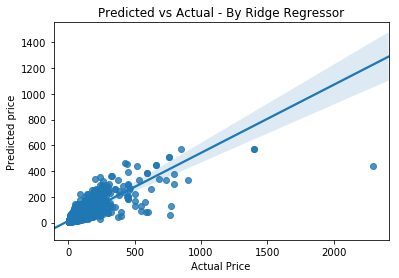

CPU times: user 6.69 s, sys: 7.03 s, total: 13.7 s
Wall time: 18.1 s


In [31]:
%%time
#####   RIDGE    ####
#rig1 = RidgeCV(alphas=np.arange(0.0001, 0.5, 0.1), cv=3)

rig1 = model_predict("Ridge Regressor", Xtr,ytr,Xte,yte, load=True)
rig1

Training set score:  0.663174457325
Test set score:  0.667759812972
Best alpha:  0.0001


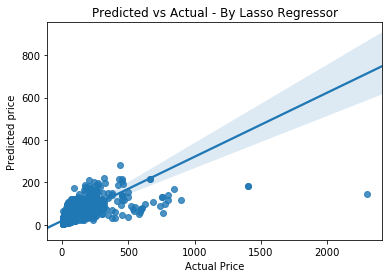

CPU times: user 6.39 s, sys: 7.08 s, total: 13.5 s
Wall time: 17.1 s


In [32]:
%%time
#####   LASSO    ####                 
#las1 = LassoCV(alphas=np.arange(0.0001, 1.0, 0.2), cv=3, random_state=179,verbose = True)
las1 = model_predict("Lasso Regressor", Xtr,ytr,Xte,yte, load=True)
las1

In [57]:
def concat_results(model1,model2,Xtr, type = 'Reg'):        # We will use this dataframe generation function to display the results
    '''Function to concatenate results from two or more regressors. Results are sorted descending and ascending and 
    column names customized.
    : model1 - list of model objects (of type regressor)
    : model2 - list of model objects (of type forests)
    : Xtr - training dataframe with column names
    : type - class of algorithm
    Returns a concatenated dataframe'''
    sorted_d = pd.DataFrame()
    sorted_a = pd.DataFrame()
    if type == 'Reg':
        count = 0
        for model in model1:
            sorted_d = pd.concat([sorted_d,pd.DataFrame(data = zip(Xtr.columns,model.coef_.ravel()),
                                columns = ['features_H'+str(count),'Highest Coef'+str(count)])\
                                .nlargest(20,'Highest Coef'+str(count)).reset_index(drop = True)],axis=1)
            sorted_a = pd.concat([sorted_a,pd.DataFrame(data = zip(Xtr.columns,model.coef_.ravel()),
                                columns = ['features_L'+str(count),'Lowest Coef'+str(count)])\
                                .nsmallest(20,'Lowest Coef'+str(count)).reset_index(drop = True)],axis=1)
            count+=1
    elif type== 'Forest':
        count = 0
        for model in model2:
            sorted_d = pd.concat([sorted_d,pd.DataFrame(data = zip(Xtr.columns,model.coef_.ravel()),columns = ['features'+str(count),
                                'Highest Coef'+str(count)]).nlargest(20,'Highest Coef'+str(count)).reset_index(drop = True)],axis=1)
            sorted_a = pd.concat([sorted_a,pd.DataFrame(data = zip(Xtr.columns,model.coef_.ravel()),columns = ['features'+str(count),
                                'Lowest Coef'+str(count)]).nsmallest(20,'Lowest Coef'+str(count)).reset_index(drop = True)],axis=1)
            count = 1
    df = pd.concat([sorted_d,sorted_a],axis = 1)
    
    return df

def hover_color(bg_c="blue",t_c = 'yellow'):
    return dict(selector="td:hover",props=[('color', t_c),("background-color", "%s" % bg_c)])

def caption_prop(pos='top',c='blue',align = 'center'):
    return dict(selector="caption", props=[("caption-side", pos),("font-size", "150%"),('color', c),
                                           ("text-align", align)])

In [58]:
concat_results([rig1,las1],[],Xtr,type = 'Reg').style.set_caption('Ridge and Lasso feature coefficients')\
.set_table_styles([hover_color(bg_c = 'yellow',t_c='red'),caption_prop(c='blue',align='center')])

,features_H0,Highest Coef0,features_H1,Highest Coef1,features_L0,Lowest Coef0,features_L1,Lowest Coef1
0,Montrachet,1.92366,Gaja,1.02704,value,-1.3802,value,-1.50292
1,Contador,1.88506,Champagne,0.939652,price,-1.03932,price,-1.45837
2,Chevalier-Montrachet,1.70746,Hermitage,0.917895,wellpriced,-1.03409,inexpensive,-0.769581
3,Gaja,1.63499,Cote Rotie,0.892308,Terras do Dão,-0.968525,affordable,-0.685814
4,Chateau Haut-Brion,1.62952,Chevalier-Montrachet,0.831674,best buy,-0.925084,bargain,-0.646339
5,Romanee-St.-Vivant,1.60369,Pauillac,0.719507,House Band,-0.914756,buy,-0.620384
6,Batard-Montrachet,1.52904,Brunello di Montalcino,0.59157,affordable,-0.911476,pos,-0.616075
7,Dal Forno Romano,1.52378,Condrieu,0.583318,Fusee,-0.896484,wellpriced,-0.595642
8,Masseto,1.49213,BOND,0.58171,bargain,-0.89435,best buy,-0.551139
9,Vega Sicilia,1.46238,Batard-Montrachet,0.579053,inexpensive,-0.883558,neu,-0.476382


We can see that words such as <font color='red'>"value", "bargain", "inexpensive", "affordable", "best buy" </font> are features given negative coefficients, hence they are good predictors of low prices, which makes a lot of sense!! 
<br><br>
Although it’s expected that we will find some winery names in the top few features, but it’s quite a surprise that ALL the words in the top 10 - 20 features are names of wineries and specific regions! This finding strongly suggests that high wine prices is mainly determined by the place of production rather than the variety or the "quality" of the WineEnthusiast's review.<br><br>

Winery:  Blair,Contador, Chateau La Mission Haut-Brion, Chateau Haut-Brion, Gaja, Chateau Latour<br>
Region:  Romanee-St.-Vivant, Chevalier-Montrachet, Batard-Montrachet
<br>

In [116]:
%%time
#####   RANDOM FOREST    ####         #### Although I would have liked to use 
rf1 = RandomForestRegressor(n_estimators=500, criterion='mse', max_depth=20, max_features='auto',n_jobs=5, random_state=195, verbose=1)
y_pred = rf1.fit(Xtr,ytr).predict(Xte)

print 'Training set score: ', rf1.score(Xtr,ytr)
print 'Test set score: ',rf1.score(Xte,yte)

Training set score:  0.767885969674
Test set score:  0.673164574165
CPU times: user 14h 59min 47s, sys: 4min 54s, total: 15h 4min 42s
Wall time: 4h 7min 1s


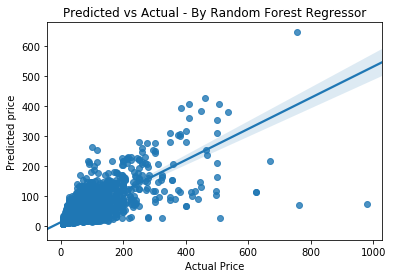

In [122]:
sns.regplot(x= np.exp(yte.ravel()), y = np.exp(y_pred.ravel())).set_title('Predicted vs Actual - By Random Forest Regressor')
plt.ylabel('Predicted price')
plt.xlabel('Actual Price')
plt.show()

In [118]:
pd.DataFrame(data = zip(X_train.columns,rf1.feature_importances_),columns = ['features','Coef'])\
                        .sort_values('Coef',ascending = False)

,features,Coef
5135,points,0.540026
1131,US,0.042870
857,Pinot Noir,0.024438
525,Cabernet Sauvignon,0.016380
51,California,0.016075
3878,price,0.013106
72,Champagne,0.012879
47,Burgundy,0.012183
5136,pos,0.010567
1109,Italy,0.010460


In [49]:
%%time
#####   ADABOOST    ###   Takes too long, and returned scores are not better than Ridge or Lasso
ada1 = AdaBoostRegressor(base_estimator=rig1,n_estimators=30, learning_rate=0.8, loss='linear',random_state = 198)

y_pred = ada1.fit(Xtr,ytr).predict(Xte)

print 'Training set score: ', ada1.score(Xtr,ytr)
print 'Test set score: ',ada1.score(Xte,yte)

Training set score:  0.494864379107
Test set score:  0.482878524518
CPU times: user 2h 23min 18s, sys: 17min 56s, total: 2h 41min 14s
Wall time: 3h 37min 42s


Training set score:  0.922495870358
Test set score:  0.712600649547


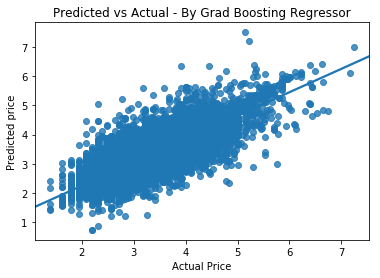

CPU times: user 3h 15min 34s, sys: 40min 36s, total: 3h 56min 10s
Wall time: 4h 21min 57s


In [30]:
%%time
#####   GRAD BOOST    #### So far it's the best regressor, even though it takes pretty long
from sklearn.ensemble import GradientBoostingRegressor
gbr1 = GradientBoostingRegressor(loss='ls', learning_rate=0.8, n_estimators=60, subsample=0.8, criterion='friedman_mse', max_depth=20)

y_pred = gbr1.fit(Xtr,ytr).predict(Xte)

print 'Training set score: ', gbr1.score(Xtr,ytr)
print 'Test set score: ',gbr1.score(Xte,yte)
sns.regplot(x= yte.ravel(), y = y_pred.ravel()).set_title('Predicted vs Actual - By Grad Boosting Regressor')
plt.ylabel('Predicted price')
plt.xlabel('Actual Price')
plt.show()


In [156]:
%%time

def findbestreg(Xtr,Xte,ytr,yte):
    '''A function that creates a dictionary of regression algorithms and iterates thru them to apply to the train and test sets. Results of the 
       R2 scores are saved in a separate results dictionary '''
    reg_algorithms = {"LassoCV":  LassoCV(alphas=np.arange(0.0001, 0.1, 0.02), cv=5, random_state=179,verbose = True),
                      "RidgeCV": RidgeCV(alphas=np.arange(0.0001, 0.1, 0.02), cv=5,store_cv_values=False),
                      "RanForReg":RandomForestRegressor(n_estimators=1000, criterion='mse', max_depth=20, n_jobs=5, random_state=195, verbose=1),
                      "DecTreeReg":DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=8),
                      "AdaReg":AdaBoostRegressor(base_estimator=RidgeCV(alphas=np.arange(0.0001, 0.1, 0.02), cv=5,store_cv_values=False),
                                                 n_estimators=30, learning_rate=0.8, loss='linear',random_state = 198),
                      "GdBoReg":GradientBoostingRegressor(loss='ls', learning_rate=0.8, n_estimators=1000, subsample=0.8, 
                                                          criterion='friedman_mse', max_depth=10)  
                    }
    results = {}
    def get_Key(dic,value):
        for key in dic:
            if value in dic[key]:
                return key
    for algo in reg_algorithms:
        print "Trying: ", algo
        clf = reg_algorithms[algo]
        ypre = clf.fit(Xtr,ytr).predict(Xte)
        y_score = clf.score(Xte,yte)
        print 'Training set score: ', clf.score(Xtr,ytr)
        print 'Test set score: ',clf.score(Xte,yte)
        results[algo] = y_score
    
    winner = get_Key(results, max(results.values()))

    print 'Winner algorithm is %s with a %f %% success' % (winner, results[winner] *100)   
    sns.regplot(x= yte.ravel(), y = ypre.ravel()).set_title('Predicted vs Actual')
   
    plt.show()
    return reg_algorithms[winner]

CPU times: user 6 µs, sys: 2 µs, total: 8 µs
Wall time: 11.9 µs


In [22]:
%%time
y_pred = dtree1.fit(Xtr,ytr).predict(Xte)

print 'Training set score: ', dtree1.score(Xtr,ytr)
print 'Test set score: ',dtree1.score(Xte,yte)

Training set score:  0.51659313725
Test set score:  0.510033121577
CPU times: user 5.24 s, sys: 621 ms, total: 5.86 s
Wall time: 6.13 s


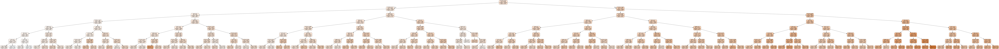

In [21]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()  

export_graphviz(dtree1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())  

## <div class = "alert alert-block alert-info"> 5. Classification : High Prices or High Points</div>
---
#### Above, we have mixed all the words in the wine description together with all the other categorical features like country, variety, region in order to predict wine prices. Now, we just focus on the description words to see what are the important words that help distinguish high points from low points or high prices from low prices. This would also allow us to understand more about this wine text corpus.  <br><br>Hence we create new target columns called "exorbitant" and "high points".  For this purpose, we define any price above \$200 as "exorbitant" and points above 90 are "high points".<br><br> For the choice of classifiers, we will go with Naive Bayes and Random Forest to help us analyse the significance of the words. Naive Bayes was chosen for its speed of computation, as time is of major concern at this stage of progress. It would provide a simple reference point for comparison with the results from Random Forest. Finally, as we are potentially dealing with imbalanced dataset, we will use random oversampling to help us improve our scores.

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import confusion_matrix,accuracy_score,auc,classification_report,roc_curve

In [13]:
# Reload wine_drop dataframe with the full description text
wine_drop = pd.read_pickle('wine_drop.pickle')
wine_dprice = wine_drop.dropna(how='any', axis = 0, inplace = False)                     # We will drop those rows with no actual price values
wine_dprice.price = np.log(wine_dprice.price)                                             # rather than using the predicted prices
wine_dprice['exorbitant'] = 0
wine_dprice['exorbitant'] = wine_dprice.price.map(lambda x: 1 if x > 5.3 else 0)

wine_drop['highpoints'] = 0                                                             # We will use the original dataframe for points since 
wine_drop['highpoints'] = wine_drop.points.map(lambda x: 1 if x > 90 else 0)            # there are no missing values

print 1 - wine_drop.highpoints.sum()/float(len(wine_drop.highpoints))                    # We have a bit of an imbalanced dataset for high points
print 1 - wine_dprice.exorbitant.sum()/float(len(wine_dprice.exorbitant))                    # We have a very imbalanced dataset for high prices,
                                                                                         # it will be very hard to beat this baseline

0.786403842968
0.994352546819


In [16]:
stop_words_2 = list(stop_words.ENGLISH_STOP_WORDS) + ['wine','flavor','fruity']

### Let's classify high prices first 

In [56]:
def concatdf(textmodel,rfcls,nbcls):        # We will use this dataframe generation function to display the results
    '''Function to concatenate results from two classifiers. Results are sorted descending and ascending and column names customized.
    : textmodel - tfidf or count vectorizers
    : rfcls - Random Forest classifier
    : nbcls - Naive Bayes classifier
    Returns a concatenated dataframe'''
    
    sorted_rf_d = pd.DataFrame(data = zip(textmodel.get_feature_names(),rfcls.feature_importances_, 
                                          nbcls.coef_.ravel()),columns = ['features','RF Coef', 'NB Coef'])\
                                            .nlargest(20,'RF Coef').reset_index(drop = True)
    sorted_nb_d= pd.DataFrame(data = zip(textmodel.get_feature_names(),rfcls.feature_importances_, 
                                         nbcls.coef_.ravel()),columns = ['features','RF Coef', 'NB Coef'])\
                                        .nlargest(20,'NB Coef').reset_index(drop = True)
    sorted_rf_a = pd.DataFrame(data = zip(textmodel.get_feature_names(),rfcls.feature_importances_, 
                                          nbcls.coef_.ravel()),columns = ['features','RF Coef', 'NB Coef'])\
                                            .nsmallest(20,'RF Coef').reset_index(drop = True)
    sorted_nb_a= pd.DataFrame(data = zip(textmodel.get_feature_names(),rfcls.feature_importances_, 
                                         nbcls.coef_.ravel()),columns = ['features','RF Coef', 'NB Coef'])\
                                            .nsmallest(20,'NB Coef').reset_index(drop = True)
    df = pd.concat([sorted_rf_d,sorted_nb_d, sorted_rf_a,sorted_nb_a],axis = 1)
    
    return df

In [111]:
# Classifying high wine prices first

X = wine_dprice.description.values
y = wine_dprice.exorbitant.values
Xtr,Xte,ytr,yte = train_test_split(X,y,test_size = 0.2, shuffle = True, random_state= 67)
print Xtr.shape
print Xte.shape
print ytr.shape
print yte.shape

(109784,)
(27446,)
(109784,)
(27446,)


In [112]:
%%time
tfidf1 = TfidfVectorizer(sublinear_tf=True,max_df=0.6,max_features=5000, ngram_range = (1,3), stop_words=stop_words_2)
ovrsam = RandomOverSampler(ratio=0.8,random_state = 10)
X_tr_sam,y_tr_sam = ovrsam.fit_sample(tfidf1.fit_transform(Xtr),ytr)
X_te_sam = tfidf1.transform(Xte)
print Xtr.shape
print ytr.shape
print X_tr_sam.shape
print y_tr_sam.shape
print X_te_sam.shape
print Xte.shape
print np.sum(y_tr_sam==1)

(109784,)
(109784,)
(196497, 5000)
(196497,)
(27446, 5000)
(27446,)
87332
CPU times: user 34.6 s, sys: 1.5 s, total: 36.1 s
Wall time: 36.1 s


In [116]:
%%time
# Naive bayes

nb1 = MultinomialNB(class_prior = [0.7,1],alpha=0.001)

y_pred_cls = nb1.fit(X_tr_sam,y_tr_sam).predict(X_te_sam)
y_score_cls =nb1.score(X_te_sam,yte)
print 'Training set score: ', nb1.score(X_tr_sam,y_tr_sam)
print 'Test set score: ',y_score_cls
print confusion_matrix(yte,y_pred_cls, labels=[1,0])
print classification_report(yte,y_pred_cls)

Training set score:  0.972554288361
Test set score:  0.949427967646
[[  107    49]
 [ 1339 25951]]
             precision    recall  f1-score   support

          0       1.00      0.95      0.97     27290
          1       0.07      0.69      0.13       156

avg / total       0.99      0.95      0.97     27446

CPU times: user 163 ms, sys: 11.8 ms, total: 174 ms
Wall time: 172 ms


In [117]:
%%time
# Random forest

rfc1 = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=10, class_weight={1:1.5, 0:1.2},n_jobs=5, random_state=153, verbose=1)

y_pred_cls = rfc1.fit(X_tr_sam,y_tr_sam).predict(X_te_sam)
y_score_cls =rfc1.score(X_te_sam,yte)
print 'Training set score: ', rfc1.score(X_tr_sam,y_tr_sam)
print 'Test set score: ',y_score_cls
print confusion_matrix(yte,y_pred_cls, labels=[1,0])
print classification_report(yte,y_pred_cls)

Training set score:  0.927113391044
Test set score:  0.918421627924
[[  129    27]
 [ 2212 25078]]
             precision    recall  f1-score   support

          0       1.00      0.92      0.96     27290
          1       0.06      0.83      0.10       156

avg / total       0.99      0.92      0.95     27446

CPU times: user 39.5 s, sys: 997 ms, total: 40.5 s
Wall time: 12.5 s


In [118]:
concatdf(tfidf1,rfc1,nb1)          # Classifying high wine prices

,features,RF Coef,NB Coef,features,RF Coef,NB Coef,features,RF Coef,NB Coef,features,RF Coef,NB Coef
0,years,0.040769,-4.936788,years,0.040769,-4.936788,000,0.0,-8.652292,000 cases produced,0.000001,-19.914874
1,cherry,0.027318,-6.304462,fruit,0.001674,-5.058143,000 cases,0.0,-9.665345,02,0.000000,-19.914874
2,aging,0.025367,-5.343708,tannins,0.016345,-5.077005,02,0.0,-19.914874,03,0.000000,-19.914874
3,age,0.023705,-5.331030,rich,0.011211,-5.182582,03,0.0,-19.914874,04,0.000007,-19.914874
4,powerful,0.020224,-5.440281,drink,0.011881,-5.217360,05,0.0,-9.503748,06,0.000000,-19.914874
5,blend,0.019145,-7.502366,long,0.018744,-5.267944,06,0.0,-19.914874,07,0.000003,-19.914874
6,long,0.018744,-5.267944,age,0.023705,-5.331030,08,0.0,-19.914874,08,0.000000,-19.914874
7,vintage,0.018197,-5.609070,aging,0.025367,-5.343708,10 cabernet,0.0,-19.914874,10 cabernet,0.000000,-19.914874
8,tannins,0.016345,-5.077005,flavors,0.009544,-5.384194,10 merlot,0.0,-19.914874,10 merlot,0.000000,-19.914874
9,pinot,0.014424,-8.641346,ripe,0.002250,-5.412234,100 cab,0.0,-19.914874,100 cab,0.000000,-19.914874


### Now for high points

In [17]:
# Classifying high points. Let's create the features and target dataframes and then train-test-split

X = wine_drop.description.values
y = wine_drop.highpoints.values
Xtr,Xte,ytr,yte = train_test_split(X,y,test_size = 0.2, shuffle = True, random_state= 67)
print Xtr.shape
print Xte.shape
print ytr.shape
print yte.shape

(120740,)
(30185,)
(120740,)
(30185,)


In [18]:
%%time
tfidf2 = TfidfVectorizer(sublinear_tf=True,max_df=0.6,max_features=5000, ngram_range = (1,3), stop_words=stop_words_2)
ovrsam = RandomOverSampler(ratio=0.8,random_state = 10)
X_tr_sam,y_tr_sam = ovrsam.fit_sample(tfidf2.fit_transform(Xtr),ytr)
X_te_sam = tfidf2.transform(Xte)
print Xtr.shape
print ytr.shape
print X_tr_sam.shape
print y_tr_sam.shape
print X_te_sam.shape
print Xte.shape
print np.sum(y_tr_sam==1)

(120740,)
(120740,)
(171160, 5000)
(171160,)
(30185, 5000)
(30185,)
76071
CPU times: user 41 s, sys: 1.34 s, total: 42.3 s
Wall time: 43 s


In [19]:
%%time
# Naive Bayes

nb2 = MultinomialNB(class_prior = [0.8,0.5])

y_pred_cls = nb2.fit(X_tr_sam,y_tr_sam).predict(X_te_sam)
y_score_cls =nb2.score(X_te_sam,yte)
print 'Training set score: ', nb2.score(X_tr_sam,y_tr_sam)
print 'Test set score: ',y_score_cls
print confusion_matrix(yte,y_pred_cls, labels=[1,0])
print classification_report(yte,y_pred_cls)

Training set score:  0.8048258939
Test set score:  0.828259069074
[[ 4762  1824]
 [ 3360 20239]]
             precision    recall  f1-score   support

          0       0.92      0.86      0.89     23599
          1       0.59      0.72      0.65      6586

avg / total       0.85      0.83      0.83     30185

CPU times: user 173 ms, sys: 29.6 ms, total: 202 ms
Wall time: 207 ms


In [78]:
from sklearn.metrics import f1_score,recall_score

def opt_nbcls(Xtr,ytr,Xte,yte):
    '''
    '''
    s,t,u,v,x = [],[],[],[],[]
    for i in np.linspace(0,1,11):
        x.append(i)
        y_pred_cls= MultinomialNB(class_prior = [i,1-i]).fit(Xtr,ytr).predict(Xte)
        s.append( f1_score(yte,y_pred_cls, pos_label=0))
        t.append(recall_score(yte,y_pred_cls,pos_label=0))
        u.append(f1_score(yte,y_pred_cls, pos_label=1))
        v.append( recall_score(yte,y_pred_cls,pos_label=1))
    plt.subplots(figsize=(10,6))
    plt.plot(x,s,'r-' )
    plt.plot(x,t,'r--')
    plt.plot(x,u,'b-' )
    plt.plot(x,v,'b--' )
    plt.vlines(x[np.argmax(u)],0,1,colors=u'k', linestyles=u'dotted')
    plt.legend(['F1 Label 0', 'Recall Label 0', 'F1 Label 1', 'Recall Label 1'], loc='upper left')
    plt.xlabel('Class_prior')
    plt.ylabel('Scores')
    plt.show()

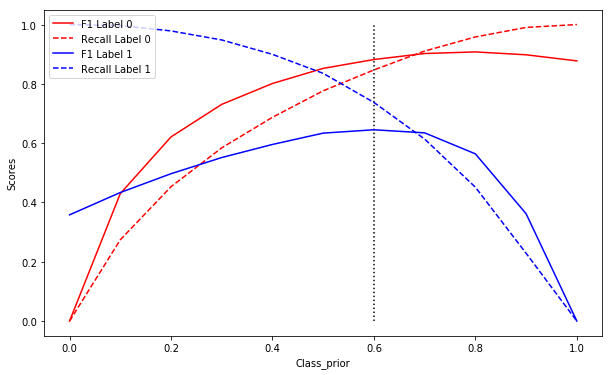

In [79]:
opt_nbcls(X_tr_sam,y_tr_sam,X_te_sam,yte)


In [96]:
%%time
# Random forest

rfc2 = RandomForestClassifier(n_estimators=100, criterion='gini', max_depth=20, class_weight={1:1.5, 0:1.4},n_jobs=5, random_state=155, verbose=1)

y_pred_cls = rfc2.fit(X_tr_sam,y_tr_sam).predict(X_te_sam)
y_score_cls =rfc2.score(X_te_sam,yte)
print 'Training set score: ', rfc2.score(X_tr_sam,y_tr_sam)
print 'Test set score: ',y_score_cls
print confusion_matrix(yte,y_pred_cls, labels=[1,0])
print classification_report(yte,y_pred_cls)

Training set score:  0.851372984342
Test set score:  0.846877588206
[[ 4737  1849]
 [ 2773 20826]]
             precision    recall  f1-score   support

          0       0.92      0.88      0.90     23599
          1       0.63      0.72      0.67      6586

avg / total       0.86      0.85      0.85     30185

CPU times: user 2min 6s, sys: 1.2 s, total: 2min 7s
Wall time: 36.3 s


In [110]:
concatdf(tfidf2,rfc2,nb2)          # Classifying high points

,features,RF Coef,NB Coef,features,RF Coef,NB Coef,features,RF Coef,NB Coef,features,RF Coef,NB Coef
0,flavors,0.046736,-5.311819,fruit,0.004437,-5.160206,08,0.0,-9.321861,88 90,3.482642e-04,-12.888731
1,years,0.040763,-5.376140,tannins,0.010288,-5.286079,acidity ready,0.0,-10.207559,88 90 barrel,3.236406e-04,-12.888731
2,rich,0.024114,-5.315059,flavors,0.046736,-5.311819,aged stainless steel,0.0,-12.107182,89 91,4.342195e-04,-12.888731
3,aromas,0.019026,-5.856095,rich,0.024114,-5.315059,aid,0.0,-11.153146,89 91 barrel,2.387562e-04,-12.888731
4,complex,0.018666,-5.900588,black,0.010649,-5.372126,aromas forest,0.0,-10.006475,90 barrel,3.166331e-04,-12.888731
5,long,0.017703,-5.817964,years,0.040763,-5.376140,aromas raspberry,0.0,-10.589207,90 barrel sample,1.679998e-04,-12.888731
6,age,0.016904,-5.960917,ripe,0.003304,-5.430473,berry herb,0.0,-10.335995,91 barrel,1.215713e-04,-12.888731
7,vineyard,0.016124,-5.998459,acidity,0.004420,-5.505930,bit sharp,0.0,-11.784819,91 barrel sample,4.513935e-04,-12.888731
8,simple,0.013987,-9.514941,spice,0.001860,-5.622277,black skinned,0.0,-9.894828,acceptable,7.758885e-07,-12.888731
9,powerful,0.013305,-6.145918,drink,0.004584,-5.647876,blend nero avola,0.0,-10.674140,bland,5.230065e-06,-12.888731



### Classification summary:

Words associated with **high price**:<br>
<font color='red'>
years, cherry, aging, age, powerful, blend, long, vintage, tannins, pinot, clean, concentrated, fruit, rich, drink, long, flavors, ripe, acidity, great</font>
<br><br>

 Both Naive Bayes and Random Forest generally agree well on the top 10 most significant words.

<br><br>

 Words associated with **high points**:<br>
<font color='red'>
flavors, years, rich, aromas, complex, long, age, vineyard, simple, powerful, impressive, beautiful, great, delicious, fruit, tannins, black, ripe, acidity, spice, drink, cherry, finish</font>
<br><br>

The top 10 words provided by Naive Bayes and Random Forest overlap slightly.


### <div class = "alert alert-block alert-info"> ** 6. Word2vec model analysis on the semantic and syntactic relationships of the text** </div>
---
#### Word2Vec is a class of neural network models that produces a vector for each word in the corpus that encodes its semantic information in an unsupervised manner. We have used TFIDF above for word representation, its scores give us some idea of a word's relative importance in a document, but they do not give any insight into its semantic meaning.<br><br>We can use Word2Vec’s models to help us measure the semantic similarity between words by computing the cosine similarity between their corresponding vectors. In particular we will use the Continuous Bag-of-words and Skip-gram models to help us understand more about our wine text corpus. <br>

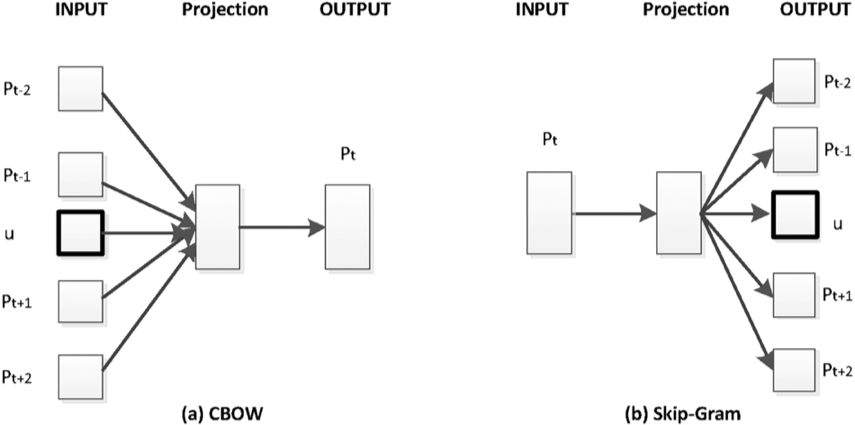

In [139]:
from gensim import models,similarities
import gensim
import graphlab as gl
from graphlab import SArray
import pyLDAvis
import pyLDAvis.gensim
import pyLDAvis.graphlab

pyLDAvis.enable_notebook()

In [140]:
cbowmodel = models.Word2Vec(token_corpus,min_count=2,negative = 5, sample=0.0005, window=3, size = 2000, sg=0)
#cbowmodel = models.Word2Vec.load('cbow2')

sgmodel = models.Word2Vec(token_corpus,min_count=2,negative = 5, sample=0.0005, window=3, size = 2000, sg=1)
#sgmodel= models.Word2Vec.load('sg2')

In [78]:
print pd.DataFrame(cbowmodel.predict_output_word(['which','valley','albarino','grown'], topn=10),columns = ['word', 'w_p'])

        word       w_p
0     sonoma  0.004720
1     county  0.003728
2       napa  0.003502
3  alexander  0.003129
4     yakima  0.003115
5   southern  0.002691
6      grown  0.002677
7      coast  0.002266
8       edna  0.002070
9      creek  0.002020


In [14]:
print pd.DataFrame(sgmodel.predict_output_word(['which','valley','albarino','grown'], topn=10),columns = ['word', 'w_p'])

         word       w_p
0       grape  0.000424
1       santa  0.000355
2      sonoma  0.000349
3       grown  0.000348
4        vine  0.000343
5       loire  0.000343
6        napa  0.000339
7  willamette  0.000337
8    southern  0.000337
9   alexander  0.000330


In [34]:
### Functions for displaying our model results in an integrated dataframe

def create_resultdf(wordlist, model, header):
    '''Simple function to concatenate multiple columns of probability results from word2vec model.
    : wordlist - list of words to find most similar words
    : model - Object instance of language model
    : header - text string of model name
    Returns a concatenated dataframe'''
    comb_df = pd.DataFrame()
    for word in wordlist:
        globals()[header+'_simi_%s_w' %word] = []
        globals()[header+'_simi_%s_p' %word] = []
        for i in range(len(model.most_similar(word))):
            globals()[header+'_simi_%s_w' %word].append(unidec(model.most_similar(word)[i][0]))
            globals()[header+'_simi_%s_p' %word].append(model.most_similar(word)[i][1])

        df = pd.DataFrame(data = zip(globals()[header+'_simi_%s_w' %word],globals()[header+'_simi_%s_p' %word]),columns = [word, word+'p'])
        comb_df = pd.concat([comb_df,df], axis = 1)
     
    return comb_df

In [151]:
test_words = ['aroma', 'taste', 'price','flora', 'potential', 'chardonnay', 'cabernet', 'steak', 'flavor']
cbow_comb_df = create_resultdf (test_words, cbowmodel, 'cbow')
cbow_comb_df.style.set_caption('cbowmodel word similarity').set_table_styles([hover_color(bg_c = 'yellow',t_c='red'),caption_prop(c='blue',align='center')])

,aroma,aromap,taste,tastep,price,pricep,flora,florap,potential,potentialp,chardonnay,chardonnayp,cabernet,cabernetp,steak,steakp,flavor,flavorp
0,scent,0.7837,tasting,0.607176,money,0.558856,mckinley,0.857399,promise,0.840388,chard,0.84165,cab,0.892673,lamb,0.844808,wave,0.658016
1,note,0.738764,smell,0.591342,value,0.517967,due,0.849807,mediumterm,0.724774,blanc,0.644532,merlot,0.754667,beef,0.781661,note,0.637655
2,nose,0.7161,biting,0.570306,inexpensive,0.51628,lonesome,0.843466,longterm,0.703334,viognier,0.594542,100cabernet,0.686776,burger,0.776712,upfront,0.629873
3,bouquet,0.704106,veers,0.543179,still,0.514576,keuka,0.821363,potentially,0.688024,sb,0.585072,oddity--cabernet,0.674409,barbecue,0.766757,accent,0.59484
4,whiff,0.667892,sugary,0.522379,everyday,0.509282,azalea,0.801177,obviously,0.671566,leesaged,0.583315,malbec,0.669858,fare,0.75466,framing,0.587951
5,tone,0.660181,jellied,0.513555,buck,0.506657,omaka,0.753297,immense,0.615961,albarino,0.577766,sauvignoncab,0.663398,hamburger,0.750835,jam,0.573428
6,accent,0.636922,veer,0.512992,sound,0.505936,mustang,0.748822,possibility,0.614011,semillon,0.572497,sauvignonmerlotcabernet,0.656296,chop,0.746041,spiced,0.573218
7,aromatics,0.634873,side,0.505931,priced,0.490664,michelleantinori,0.731722,future,0.610891,barrelfermented,0.5665,syrah,0.654519,wine--something,0.743698,fruit,0.572319
8,blast,0.623391,border,0.505925,score,0.489416,limoux,0.725384,packing,0.602517,gewurz,0.563889,sauvignoncabernet,0.626823,cheeseburger,0.735402,tangy,0.57134
9,smelling,0.614892,tad,0.500585,expensive,0.488313,unsung,0.72441,certainty,0.599312,riesling,0.559615,reassuringly,0.616781,character--with,0.72413,accented,0.564988


In [150]:
sg_comb_df = create_resultdf (test_words, sgmodel, 'sg')
sg_comb_df.style.set_caption('sgmodel word similarity').set_table_styles([hover_color(bg_c = 'yellow',t_c='red'),caption_prop(c='blue',align='center')])

,aroma,aromap,taste,tastep,price,pricep,flora,florap,potential,potentialp,chardonnay,chardonnayp,cabernet,cabernetp,steak,steakp,flavor,flavorp
0,desiccated,0.644205,tasting,0.590467,tag,0.598272,styria,0.815371,mediumterm,0.668716,chard,0.686971,cab,0.73155,chop,0.8097,chaser,0.694121
1,revolve,0.638937,confection,0.585493,dollar,0.575652,arrufiac,0.813687,promise,0.664753,semillon,0.591798,merlot,0.686804,lamb,0.793308,overlaid,0.689941
2,joining,0.638436,flawed,0.570752,buck,0.566794,crouchen,0.80906,possibility,0.643577,grigio,0.550274,merlotcabernet,0.667545,beef,0.749409,conclude,0.689243
3,preface,0.637774,candysweet,0.569141,bargain,0.548733,viosinho,0.808736,ageing,0.636283,chenin,0.542224,cabernetbased,0.650891,cheeseburger,0.7462,joining,0.683101
4,recalling,0.637269,sugarysweet,0.558972,darned,0.547403,seyval,0.807777,shortterm,0.634338,gris,0.535448,franc,0.642807,burger,0.742268,dealing,0.680093
5,note,0.635308,weirdly,0.558646,have,0.546045,albarino,0.807653,future,0.626425,pg,0.534961,claret,0.642799,grill,0.742014,toastyoak,0.677625
6,brushstrokes,0.634122,awkwardly,0.554364,overpriced,0.533609,gascogne,0.807592,bodes,0.621309,leesaged,0.530107,cabbased,0.639355,hamburger,0.740495,oakinfused,0.67747
7,underside,0.633927,sandpaper,0.550463,lately,0.528427,csv,0.807425,repay,0.619153,tankfermented,0.524292,caberent,0.638397,charbroiled,0.736155,whitepepper,0.677175
8,graced,0.633079,sweet--like,0.548521,under10,0.526337,exorbitantly,0.805411,potential--perhaps,0.612658,aficionado,0.508926,tannat,0.630287,rib,0.721708,counterbalanced,0.676575
9,host,0.630651,suffers,0.547156,money,0.52144,siria,0.80539,moreysaintdenis,0.610176,chardonay,0.50716,bordeauxstyle,0.630193,stew,0.715298,cinnamonlike,0.671211


<img src = 'https://excellenceresorts.files.wordpress.com/2013/11/er_wine-chart.jpg' style="width: 600px;">

## <div class="alert alert-block alert-info"> <font color='purple'>7. Building a text generative model</font></div>
---

### Wine text corpus stats : <br>
1. Number of documents = 150925<br>
2. Total number of characters ~ 36 M<br>
3. Total number of sequences ~ 1.2 M (Based on sequence length 30, batch size 50)<br>
4. Total number of batches ~ 24000<br>
5. Total Number of character classes = 98

## Some considerations when building a generative model:

### 1. CNN or RNN<br>
RNN for time dependent or sequence dependent data <br>
CNN for spatial dependent data <br>
<br>
### 2. But isn’t RNN hard to train due to vanishing gradient problem?<br>
Solutions: <br>
a) ReLU over Sigmoid or Tanh<br>
b) Gated / LSTMs over vanilla RNN <br>
<br>
### 3. Character or word embeddings level training<br>
Depends on the text corpus : <br>
    a) Character - If simple structure, with clean characters, small vocabulary and little long-term dependencies <br>
    b) Word embeddings - If complex sentence structure and wish to preserve semantics<br>
<br>
### 4.  Tensorflow or Keras<br>
Depends on personal preference<br>
In tensorflow, have to be very careful with the feed_dict and all datatypes are represented in tensor forms.

## $$Gated Recurrent Unit$$

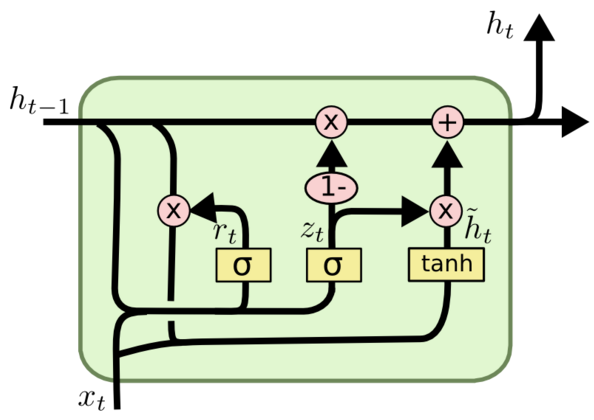
### $$update\_gate = \sigma(W_u\cdot[h{_t}{_-}{_1},x_t] + b_u)$$
### $$reset\_gate = \sigma(W_r\cdot[h{_t}{_-}{_1},x_t] + b_u)$$
### $$  \hbar_t = tanh(W\cdot[r{_t}*h{_t}{_-}{_1},x_t] + b_z)$$
### $$ h_t = (1-z_t)*h{_t}{_-}{_1} + z_t*\hbar_t $$


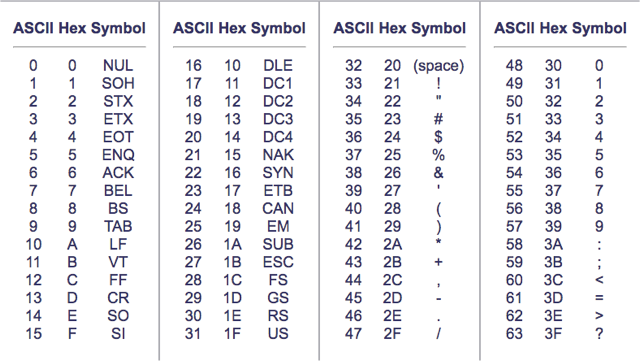
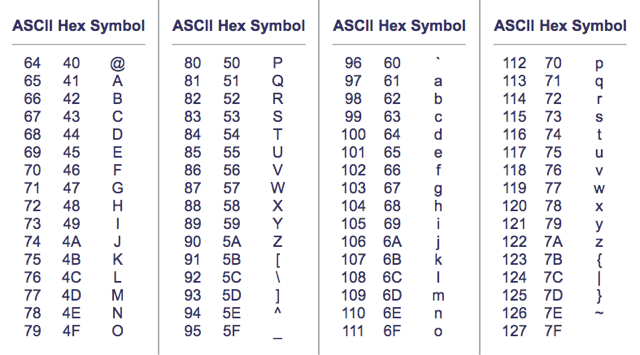

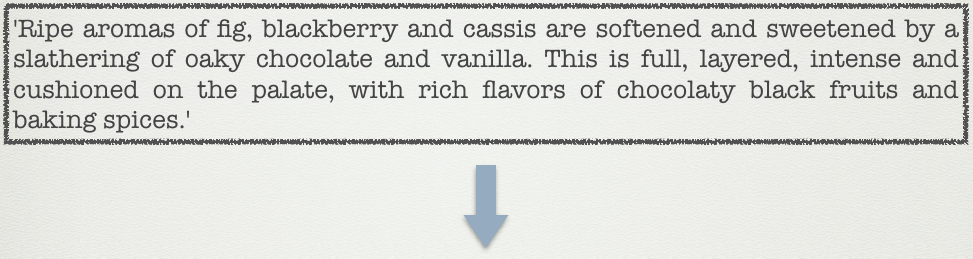
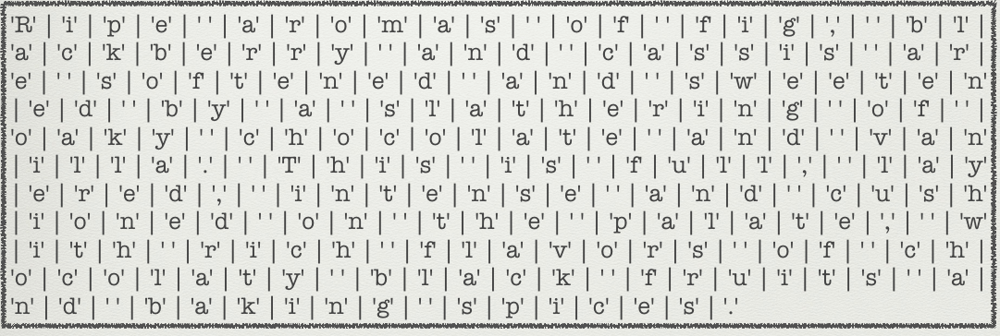

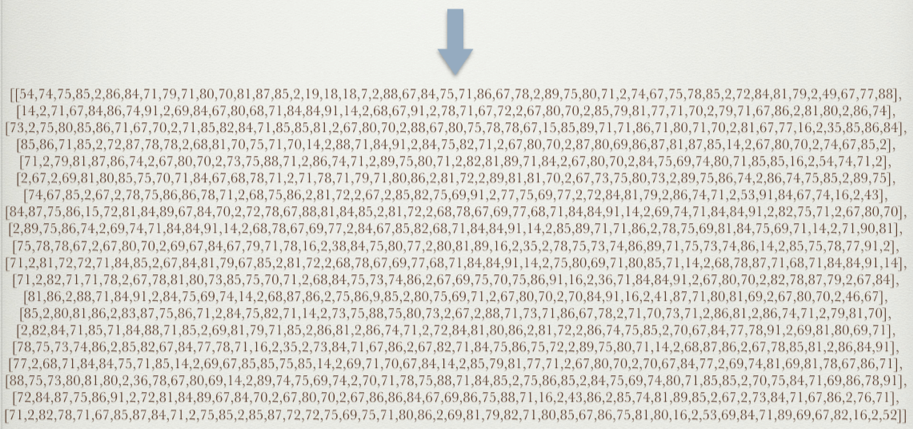
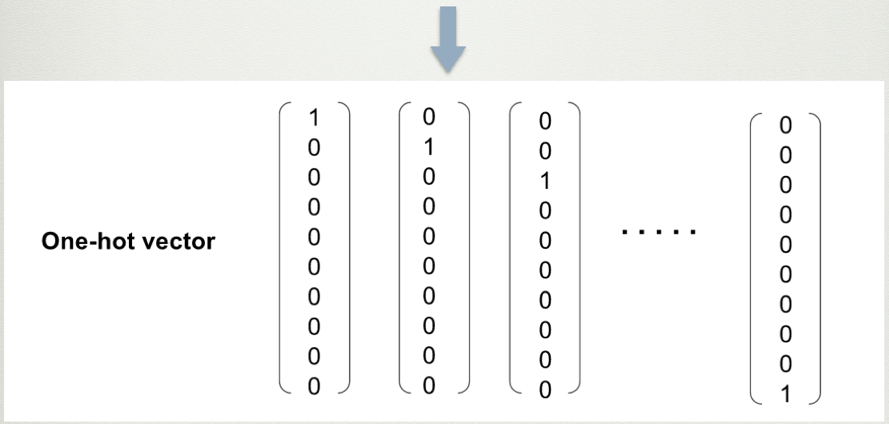

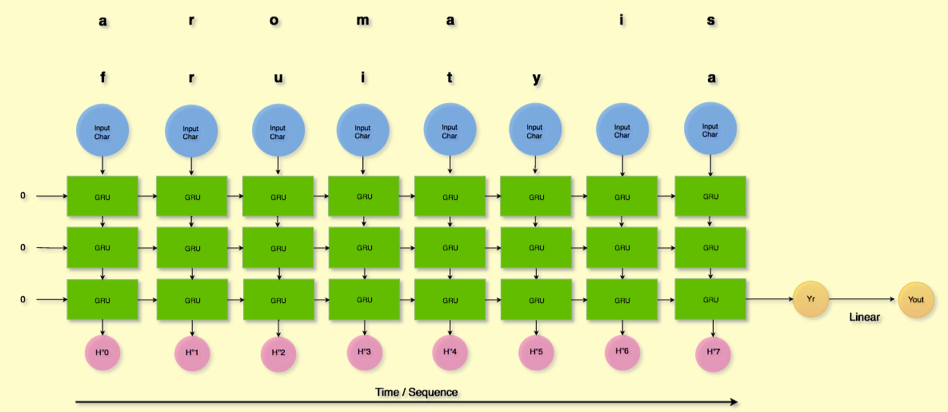


In [1]:
import tensorflow as tf
from tensorflow.contrib import layers
from tensorflow.contrib import rnn  
import os
import time
import math
import pickle
import urllib
from trainer import train_textproc as txtpro
tf.set_random_seed(0)

In [2]:
pathToOutput = "./output_for_local/"

### Set our global constants 


In [6]:
%%time

seq_len = 30
batch_size=50
num_char = txtpro.num_char
cell_size = 100
num_layers = 2
learning_rate = 0.001  # fixed learning rate
dropout = 0.7

url = 'wine_uncoded.pickle'

wine = pd.read_pickle(url)
ascii_text, valitext, reviewlen = txtpro.read_data(wine.description, validation=True)

### Show info on data size ###

epoch_size = len(ascii_text) // (batch_size * seq_len)
txtpro.print_data_stats(len(ascii_text), len(valitext), epoch_size)

Training text size is 32.91MB 
Validation text size is 1878.71KB 
There are 23008 batches per epoch
CPU times: user 20.2 s, sys: 978 ms, total: 21.1 s
Wall time: 21.7 s


### Create placeholders in Tensorflow, where our batches of data have to be fed thru the feed_dict 

In [7]:
learning = tf.placeholder(tf.float32, name='learning')
pkeep = tf.placeholder(tf.float32, name='pkeep')
batch = tf.placeholder(tf.int32, name='batch_size')
InputX = tf.placeholder(tf.uint8, [None, None], name='InputX')
InputY_ = tf.placeholder(tf.uint8, [None, None], name='InputY_')
Hin = tf.placeholder(tf.float32, [None, cell_size* num_layers], name='Hin')

Xoh = tf.one_hot(InputX, num_char, 1.0, 0.0)
Yoh_ = tf.one_hot(InputY_, num_char, 1.0, 0.0)

### Setting up the model architecture

In [8]:
cells     = [rnn.GRUCell(cell_size, activation=tf.nn.relu) for j in range(num_layers)]
dropcells = [rnn.DropoutWrapper(cell,input_keep_prob=pkeep) for cell in cells]
multicell = rnn.MultiRNNCell(dropcells, state_is_tuple=False)
multicell = rnn.DropoutWrapper(multicell, output_keep_prob=pkeep)

Yr, H = tf.nn.dynamic_rnn(multicell, Xoh, dtype=tf.float32, initial_state=Hin) # Yr: [ batch_size, seq_len, cell_size ]
H = tf.identity(H, name='H')                                                   # H:  [ batch_size, cell_size*num_layers ] 
                                                                               # this is the last state in the sequence

Yflat = tf.reshape(Yr, [-1, cell_size])                                       # [ batch_size x seq_len, cell_size ]
Ylogits = layers.linear(Yflat, num_char)                                      # [ batch_size x seq_len, num_char ]
Yo = tf.nn.softmax(Ylogits, name='Yo')                                        # [ batch_size x seq_len, num_char ]
Y = tf.argmax(Yo, 1)                                                          # [ batch_size x seq_len ]
Y = tf.reshape(Y, [batch, -1], name="Y")                                      # [ batch_size, seq_len ]

Yflat_ = tf.reshape(Yoh_, [-1, num_char])                                     # [ batch_size x seq_len, num_char ]
loss = tf.nn.softmax_cross_entropy_with_logits(logits=Ylogits, labels=Yflat_) # [ batch_size x seq_len ]
loss = tf.reshape(loss, [batch, -1])                                          # [ batch_size, seq_len ]
seqloss = tf.reduce_mean(loss, 1)
batchloss = tf.reduce_mean(seqloss)
accuracy = tf.reduce_mean(tf.cast(tf.equal(InputY_, tf.cast(Y, tf.uint8)), tf.float32))

global_step = tf.Variable(1, trainable=False)
lrn = tf.train.exponential_decay(learning, global_step,500, 0.95, staircase=True)      # decaying learning rate
train_step = tf.train.AdamOptimizer(lrn).minimize(loss,global_step=global_step)

### Save all the info to summary, to be analysed in Tensorboard later 

In [9]:
loss_summary = tf.summary.scalar("batch_loss", batchloss)
acc_summary = tf.summary.scalar("batch_accuracy", accuracy)
learning_rate_summary = tf.summary.scalar("learning_rate", lrn)
summaries = tf.summary.merge([loss_summary, acc_summary,learning_rate_summary])


### Initialize Tensorboard. Both training and validation data are saved so we can visualize them in Tensorboard. ###

timestamp = str(math.trunc(time.time()))
sess = tf.Session(config=tf.ConfigProto(allow_soft_placement=True,log_device_placement=True))
summary_writer = tf.summary.FileWriter(pathToOutput + timestamp + "-training",sess.graph)
vali_writer = tf.summary.FileWriter(pathToOutput + timestamp + "-validation",sess.graph)

In [10]:
### Create saver object to save models to a directory named 'checkpoints'. Only the last 5 checkpoints are kept.                                                    ###

if not os.path.exists("checkpoints"):
    os.mkdir("checkpoints")
saver = tf.train.Saver(max_to_keep=5)

### Initialize the display parameters ###
display_f = 100
_100_Batches = display_f * batch_size * seq_len


### Initialize all variables ###
instate = np.zeros([batch_size, cell_size*num_layers])  # initialize input state to 0
init = tf.global_variables_initializer()
sess.run(init)
step = 0

### Training loop with data batches, validation and generation of text. Expect around 1 min response lag due to training on 500 batches each time before displaying stats. If faster response is desired, can reduce to training just 200 batches between displays.

In [11]:
# Loop training, validating, summary writing, and model saving over n epochs
# Sequencer function will keep yielding batches of text for each training loop
for x, y_, epoch in txtpro.sequencer(ascii_text, batch_size, seq_len, num_epochs=2):

    # Training session
    feed_our_data = {InputX: x, InputY_: y_, Hin: instate, learning: learning_rate, pkeep: dropout, batch: batch_size}
    tr_step, y, outstate = sess.run([train_step, Y, H], feed_dict=feed_our_data)


    # Validate and log data every 500 batches
    if step >0 and step  % _100_Batches == 0 and len(valitext) > 0:
        feed_our_data = {InputX: x, InputY_: y_, Hin: instate, learning: learning_rate, pkeep: 1.0, batch: batch_size}  # no dropout for validation
        y, l, bl, acc, smm = sess.run([Y, seqloss, batchloss, accuracy, summaries], feed_dict=feed_our_data)
        txtpro.print_learning(x, y, l, reviewlen, bl, acc, epoch_size, step, epoch)
        summary_writer.add_summary(smm, step)                                    # save training data for Tensorboard

        valid_seq_len = 1024
        bsize = len(valitext) // valid_seq_len
        txtpro.print_validation_header(len(ascii_text), reviewlen)
        vali_x, vali_y, revlen = next(txtpro.sequencer(valitext, bsize, valid_seq_len, 1))      # all data in 1 batch
        vali_nullstate = np.zeros([bsize, cell_size*num_layers])
        feed_our_valdata = {InputX: vali_x, InputY_: vali_y, Hin: vali_nullstate, learning: learning_rate,
                           pkeep: 1.0, batch: bsize}                                        #no dropout for validation
        ls, acc, lrn_rate, smm = sess.run([batchloss, accuracy, lrn, summaries], feed_dict=feed_our_valdata)
        print "VALIDATION STATS:           learning rate: {:.5f},        loss: {:.5f},         accuracy: {:.5f}\
                \n\n\n".format(lrn_rate,ls, acc)

        vali_writer.add_summary(smm, step)                                     # save validation data for Tensorboard


    # Generate a chunk of 1000 text using the current weights and biases (every 2000 batches)
    if step // 20 % _100_Batches == 0:
        print "\n"+"{:-^111}".format('Generating random text from current state in the model')
        ry = np.array([[txtpro.conv_fr_char(np.random.randint(98))]])
        rh = np.zeros([1, cell_size * num_layers])
        gentext = []
        for k in range(1000):
            ryo, rh = sess.run([Yo, H], feed_dict={InputX: ry, pkeep: 1.0, Hin: rh, batch: 1})
            rc = txtpro.sample_from_prob(ryo, top_n=10 if epoch <= 1 else 2)
            gentext.append(chr(txtpro.conv_to_char(rc)))
            ry = np.array([[rc]])
        print ''.join([c for c in gentext])
        print "\n"+"{:-^111}\n\n\n".format('End of generation')


    # Save our models (every 5 epochs)
    if  epoch % 5 ==0 and epoch >0:
        saved_file = saver.save(sess, pathToOutput+'/checkpoints/rnn_train_' + step, global_step=step)
        print "Saved file: " + saved_file

    # Loop the state so that the last output state of the previous epoch will be used in the new epoch
    instate = outstate
    step += batch_size * seq_len


----------------------------Generating random text from current state in the model-----------------------------
tooVo {fGJJ oGdfoG
Ghk
kodG]RGfo]
kGR]k]b{kfk
UJd bddoJdbb{dmdkGhRGoGGod
okofGR]Rfffo] 
 00okb]
dkfkfRf JJodVoURRRoRkkok okVoGkGb{]GUodJ
f{doJRo{G
  o]dtf

dRfRdRb {d bofJfdbo kRG]k]UGR{UfJ
kfokkR{V{UooG]k{G]GfofdkGb ]]dRG{Rfo]oRkbffdfoR]f0 d {
bdhfkk JooURGoGddGJU{UUd U{moUaJJmmm UofGRRRd0
R
R{bb{0JVJ dJtJVJoGV ddbUooJRdJoGdo fkmbkk ddG h{G{Ud{dR Gf{od bGdb]
oRR
dbRofff df0
okJ RVdoG{dfkGRb ]G{h
dofdJoRdRbob
fR
kkbfVJR0R 
ko{]Rddf]Vf R0fRd{ 0
ofdodk odJd?ooJ?kmGmfm]JRdkk o doRUUoJdoGGoU]kJ{{U]GsGUJaU aJaoa$d$ RU{JaodR b obGd o{fk{hG]k]oG Rf{RddR 
bRR0{
o]d 
]f Rfdk
o]kG]k{b{RdoJ]oGokd{U{ Jk{hh {VVGG{{]G]fkod fo
Jd dJ?{RkbhRhUU RdoVboGVdfG
k]kUGoG ]

{
khkGhUfRUo JUG{
UGGf   d0
o{Jbfkd{d{JhG ]UhGUhfJRGoRd
GUokUdbUbm dJkmGJmdoU{od{mdo GkbGdkdGoUkRhooGohfohGhRUoG]{
okdddoJmkGdRmm{d dd ddJJbGRbJRoR0]o d]GJ{{hff]]ofJddkdRVJk{bkbG]V]]]fJdfGG
0o
]{
GkdoGGkkddkkbhdkhbhJoRGdR]] dRUb

 (epoch 0)  │ tannins and the 28 months of n │                                │ loss: 2.97947
 (epoch 0)  │ mile-tisane notion and boosts  │                                │ loss: 2.81421
 (epoch 0)  │  and fresh, this well-balanced │                                │ loss: 2.98028
 (epoch 0)  │ und, full-bodied wine, voluptu │                                │ loss: 3.29284
 (epoch 0)  │ om the best Grenache (75%) and │   e                            │ loss: 3.67075
 (epoch 0)  │ ed tannins fill the mouth, and │                                │ loss: 2.75518
 (epoch 0)  │ k fruit, tobacco and black che │                                │ loss: 2.98381
 (epoch 0)  │ e rest Petite Sirah, sourced f │                                │ loss: 2.98267
 (epoch 0)  │ on the dry side, needing 2-3 y │                                │ loss: 3.14556
 (epoch 0)  │ aleo opens with a bright, almo │                                │ loss: 2.93687
 (epoch 0)  │ ne and don't drink before 2017 │              

VALIDATION STATS:           learning rate: 0.00100,        loss: 3.02081,         accuracy: 0.16739                



 (epoch 0)  │  nose of this always-excellent │ aet  an ahen ane n  ar er      │ loss: 2.75414
 (epoch 0)  │ started to show itself properl │ oen    ahrteer an     aiene    │ loss: 2.72567
 (epoch 0)  │ age well. Drink from 2017. Thi │ n  aire  aoen  aieneaa    ahen │ loss: 3.06609
 (epoch 0)  │ r make a fine wine. Oso Libre  │  aen  antrne ain   ao raone  t │ loss: 2.75576
 (epoch 0)  │ s even more going on once sipp │  arer ten  aont  an tn   aonee │ loss: 2.56524
 (epoch 0)  │ or intensity slightly off-kilt │ r an     t  aoen     an  aen   │ loss: 2.88412
 (epoch 0)  │  Dry Creek origins in the spic │ aoe aoer  an t t  an the aoene │ loss: 2.68707
 (epoch 0)  │ careful oak aging have helped  │ one  netnn an t  aene ae   r a │ loss: 2.75644
 (epoch 0)  │ cherry, creme de cassis and bl │ oe     aoere te aon  n and air │ loss: 2.36536
 (epoch 0)  │ lcome freshness. Afte

VALIDATION STATS:           learning rate: 0.00100,        loss: 2.61095,         accuracy: 0.30568                



 (epoch 0)  │ sh of saltiness. This comes ac │  ean ahne n     Thes aarer ane │ loss: 2.24349
 (epoch 0)  │  balanced Brunello. The palate │ tinend   aaitt   n The ainen   │ loss: 2.32210
 (epoch 0)  │ and made with no selected yeas │ nd aon  ainh aetth       airn  │ loss: 2.22684
 (epoch 0)  │ er than tannin, oak or alcohol │   ahe  ahnd n  and an an  r    │ loss: 2.46179
 (epoch 0)  │ e, packed with savory elements │   aine r ainh a ner  ar        │ loss: 2.21484
 (epoch 0)  │ ids. This opens with floral ar │ n   Thes an    aith araren an  │ loss: 2.09540
 (epoch 0)  │  to the finish. Definitely a w │ ahnthe arnet   Trrrnesh   anti │ loss: 2.26869
 (epoch 0)  │ hearty blend of Magliocco (a g │ irs   aaar  an aoneenn erarnto │ loss: 2.79971
 (epoch 0)  │ s. Drink now with rich foods t │   Trite aen ainh aanh arrr  ah │ loss: 2.21069
 (epoch 0)  │ this a refreshing, ea

VALIDATION STATS:           learning rate: 0.00100,        loss: 2.41674,         accuracy: 0.33057                



 (epoch 0)  │ el, this well-balanced wine co │ r  ahes aine aerende  aite aor │ loss: 2.10125
 (epoch 0)  │ nose is still shy but already  │ in  an ahene ahe aet and  n  a │ loss: 2.32083
 (epoch 0)  │ se the Cahors AOP is only red  │   ahe aoner  andean af   ain a │ loss: 2.77227
 (epoch 0)  │ on touches appear on the nose  │ n ah th   anderr an the tin  a │ loss: 2.09195
 (epoch 0)  │ berry and plum flavors end her │ er   and aeetearaner  and air  │ loss: 1.87970
 (epoch 0)  │  espresso, licorice and raspbe │ an ee   f tith  nh and ainteer │ loss: 2.36220
 (epoch 0)  │ n the baked and heavy side, bu │  the ter   and airne aone  aot │ loss: 1.99241
 (epoch 0)  │ given the frost and smoke issu │ ite  ahe aran  and ahen  an  n │ loss: 2.13083
 (epoch 0)  │ m the traditional Bordeaux var │ eahe ahen nhnn neaar   ns aene │ loss: 2.67729
 (epoch 0)  │  possess a fresh, zes

line 143384, line 143385, line 143386, line 143387, line 143388, line 143389, line 143390, line 143391, line 143392, line 143393, line 143394, line 143395, line 143396, line 143397, line 143398, line 143399, line 143400, line 143401, line 143402, line 143403, line 143404, line 143405, line 143406, line 143407, line 143408, line 143409, line 143410, line 143411, line 143412, line 143413, line 143414, line 143415, line 143416, line 143417, line 143418, line 143419, line 143420, line 143421, line 143422, line 143423, line 143424, line 143425, line 143426, line 143427, line 143428, line 143429, line 143430, line 143431, line 143432, line 143433, line 143434, line 143435, line 143436, line 143437, line 143438, line 143439, line 143440, line 143441, line 143442, line 143443, line 143444, line 143445, line 143446, line 143447, line 143448, line 143449, line 143450, line 143451, line 143452, line 143453, line 143454, line 143455, line 143456, line 143457, line 143458, line 143459, line 143460,

KeyboardInterrupt: 

#### <div class = "alert alert-block alert-warning"> This model takes 1 - 2 days to finish running 20 epochs, even when GPU is used. Hence I am only training it using python in Google Cloud VM instance and not Jupyter Notebook. Attached below are the results that I obtained from training in the cloud. </div>

## <div class = "alert alert-block alert-info"> 8. Results: </div>
---

### After 100 batches:
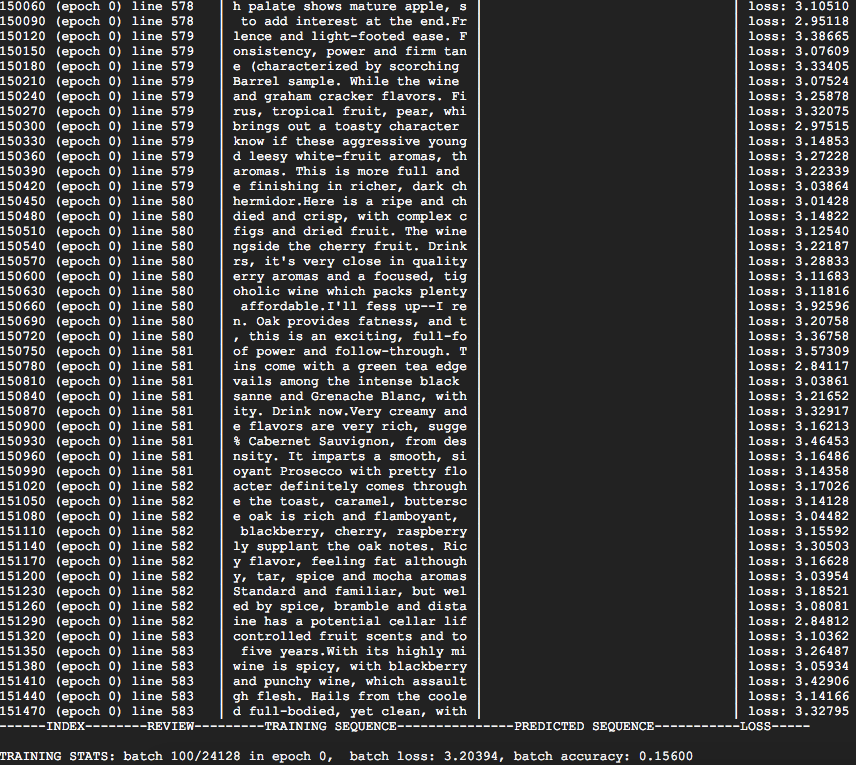
<br><br>
### After 500 batches:
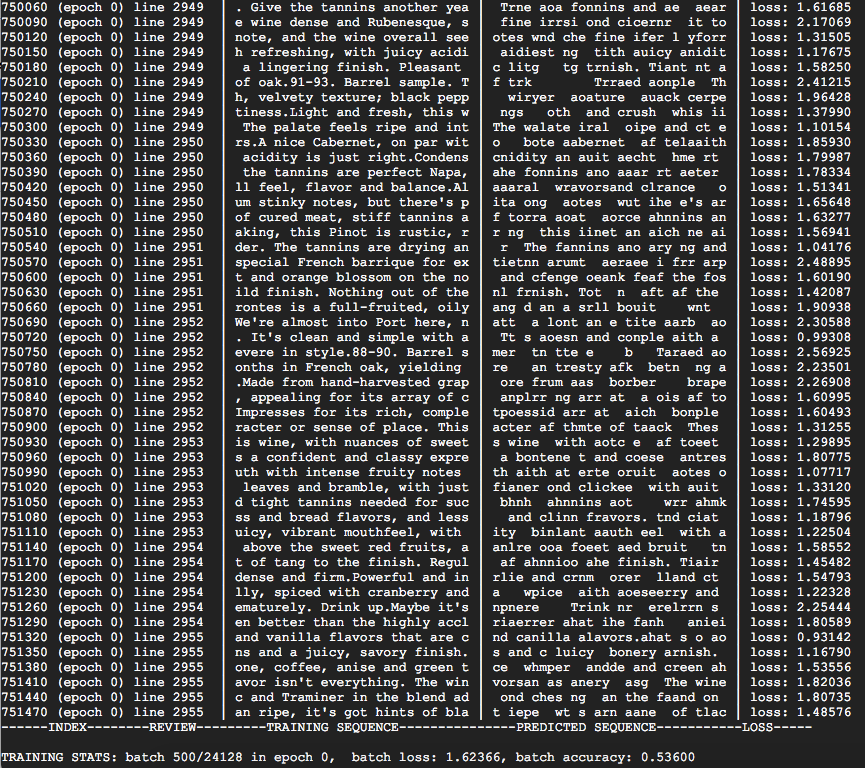

<br><br>
### After 2500 batches:
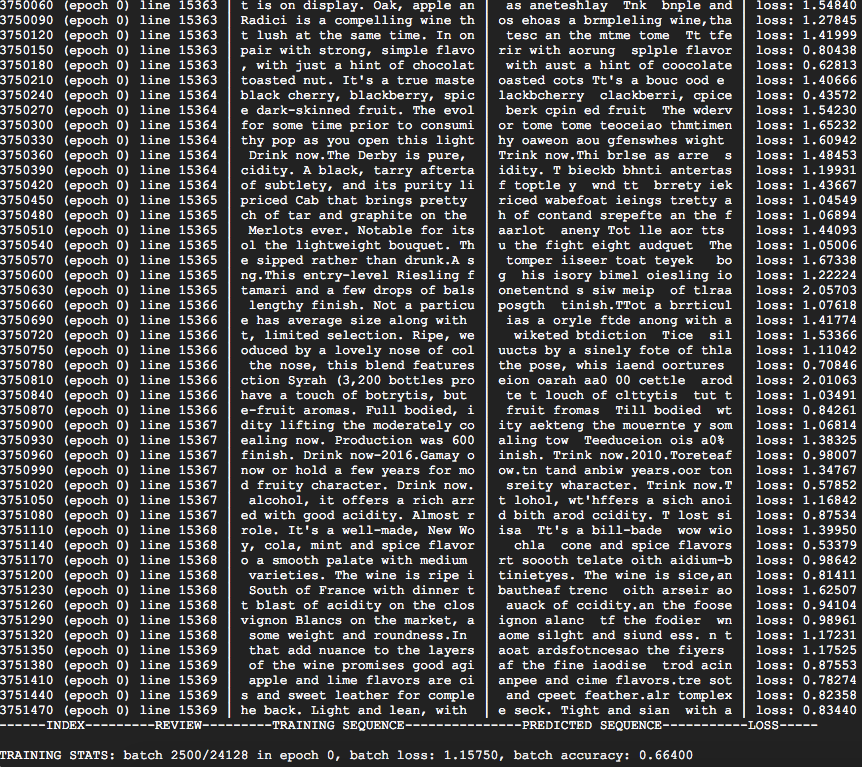

## Using tanh as activation function and cellsize 512:
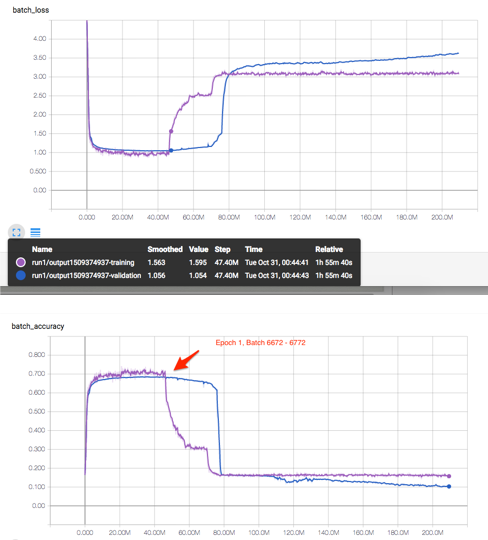
<br>
## Using Relu as activation function and cellsize 250, learning rate 0.0001:
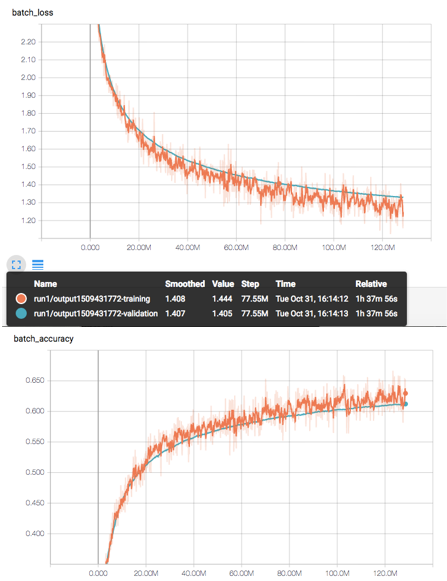
<br>
## Using Relu as activation function and cellsize 250, learning rate 0.001 starting and decaying:
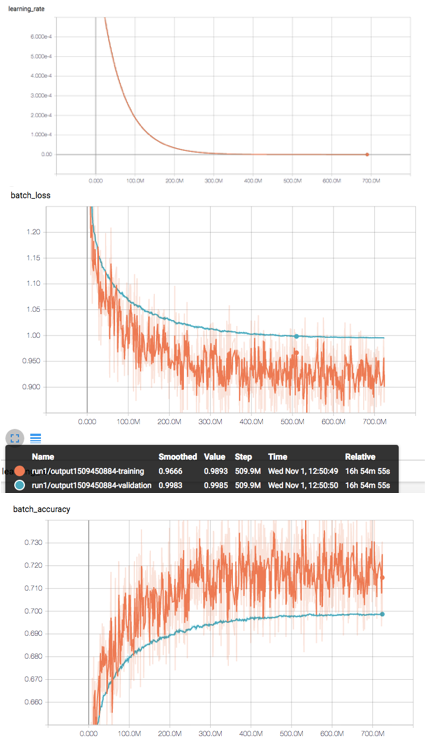

## <div class = "alert alert-block alert-info"> <font color="black">Generated text samples </font></div>

### Right at the start:
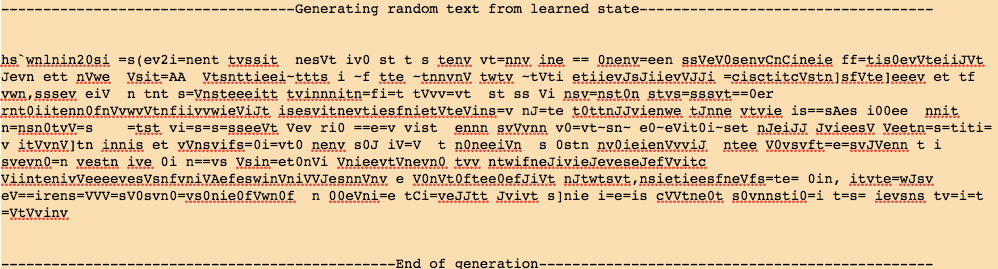
<br>
### After 4000 batches:
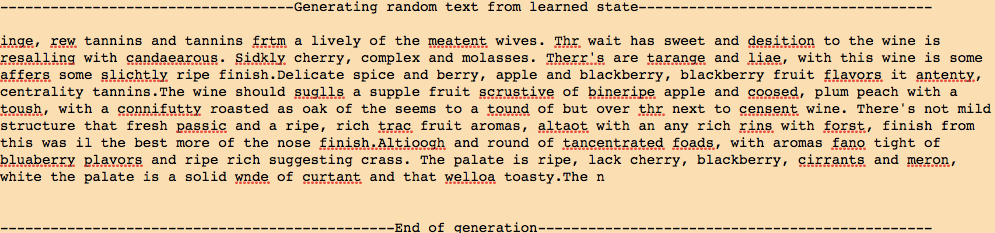
<br>
### After 1 epoch:
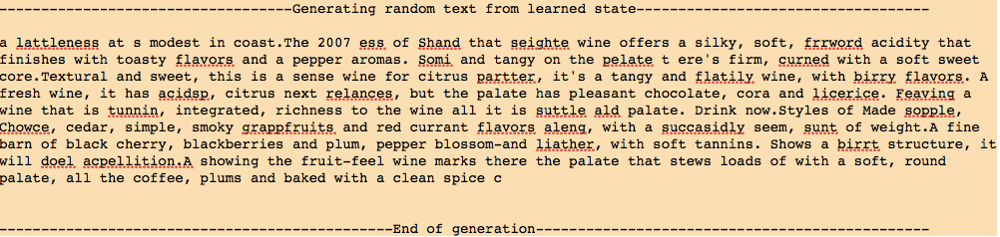
<br>
### After 5 epochs:
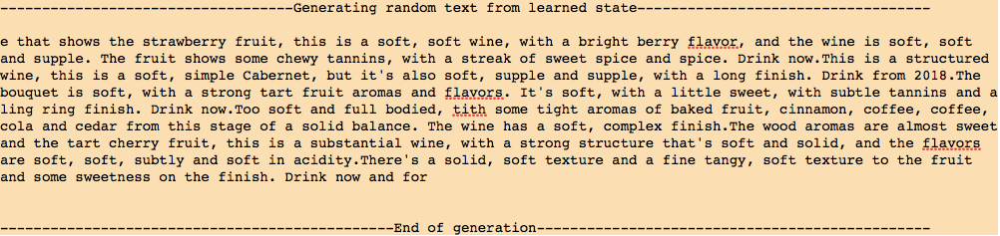

## <div class = "alert alert-block alert-info"> 9. Suggested further work 
--- 
<font size = '3'> 1. Increasing the input sequence length or number of hidden layers to improve accuracy <br><br> 2. Using the Word2Vec model to create a word embedding layer to the RNN to generate word sequences instead of character sequences <br><br> 3. Using the RNN with word embeddings layer to try to classify the 632 varieties of wine. </font>